In [ ]:
### Code to generate plots shown in Figure 1 and Extended Data Figures 1-6

In [1]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import matplotlib.pyplot as plt
import scanpy as sc
import pandas as pd
import seaborn as sb
import ma_codes as codes
from ma_codes import mysize, gray_red, mymap
import pertpy as pt
import seaborn as sns
%matplotlib inline
sc.settings.verbosity = 3               # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_version_and_date()

Running Scanpy 1.10.2, on 2025-05-06 16:35.


In [2]:
plot_folder = "/home/gotej/Projects/Aging_BleoModel/Plots/"
plt.rcParams['pdf.fonttype'] = 42

### Load data objects

In [3]:
object_folder = "/media/HDD_1/Janine/Aging_SingleCell/data_objects/"
adata = sc.read(object_folder + "230111_Bleo_Ageing_annotated_final.h5ad")

sc.set_figure_params(adata, vector_friendly=True, format='pdf', dpi_save=300, facecolor=None, transparent=False, ipython_format='png2x')
plt.rcParams['pdf.fonttype'] = 42

In [4]:
adata

AnnData object with n_obs × n_vars = 160477 × 29814
    obs: 'age', 'barcode', 'batch', 'day', 'name', 'sex', 'treatment', 'identifier', 'n_counts', 'n_genes', 'percent_mito', 'doublet_scores', 'size_factors', 'S_score', 'G2M_score', 'phase', 'time_point', 'leiden_1', 'leiden_2', 'domain', 'cell_type', 'ct_level2', 'compartment_label', 'meta_label', 'age_treatment', 'age_day'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'age_colors', 'age_day_colors', 'age_treatment_colors', 'batch_colors', 'cell_type_colors', 'compartment_label_colors', 'ct_level2_colors', 'day_colors', 'dendrogram_cell_type', 'domain_colors', 'hvg', 'leiden', 'leiden_1_colors', 'leiden_2_colors', 'meta_label_colors', 'name_colors', 'neighbors', 'pca', 'sex_colors', 'time_point_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'unsouped_counts'
    obsp: 'connect

In [5]:
adata.obs.time_point.value_counts()

time_point
d0     53778
d10    25117
d20    24010
d3     21501
d30    20014
d37    16057
Name: count, dtype: int64

### Export overview plots for entire dataset

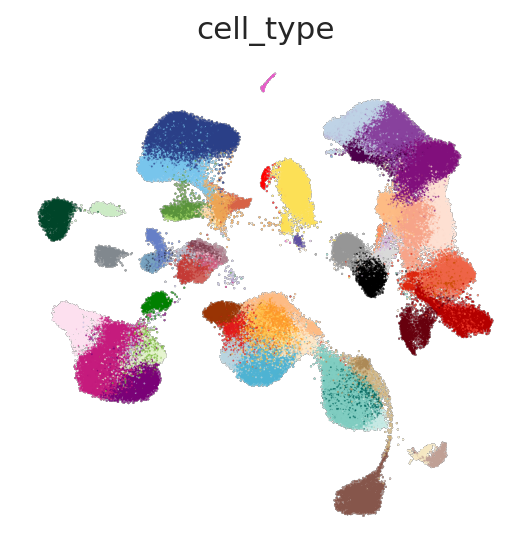

In [6]:
sc.pl.umap(adata, color = ["cell_type"], frameon=False, add_outline=True, 
           outline_width=(0.05, 0.01), size=3, ncols=1, 
           legend_loc= None, legend_fontoutline=False, legend_fontweight="medium", 
           save=("_whole_ct_without_legend.pdf"))

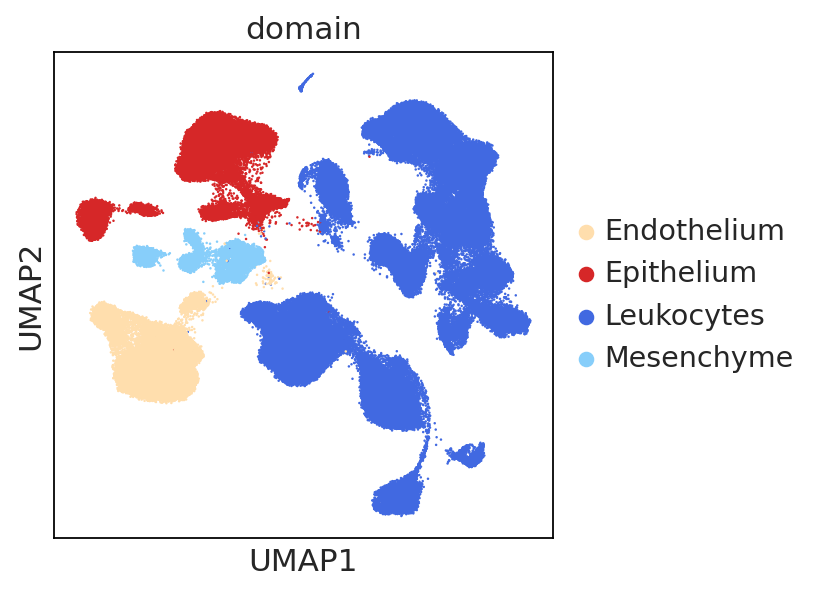

In [7]:
ct_map = {
    'Epithelium'  : 'Epithelium',
    'Endothelium' : 'Endothelium',
    'Mesenchyme'  : 'Mesenchyme',
    'Leukocytes'  : 'Leukocytes',
    'Megakaryocytes' : 'Leukocytes'}
adata.obs["domain"] = [ct_map[ct] for ct in adata.obs.domain]
sc.pl.umap(adata, color = ["domain"], size = 5, wspace = 0.25)

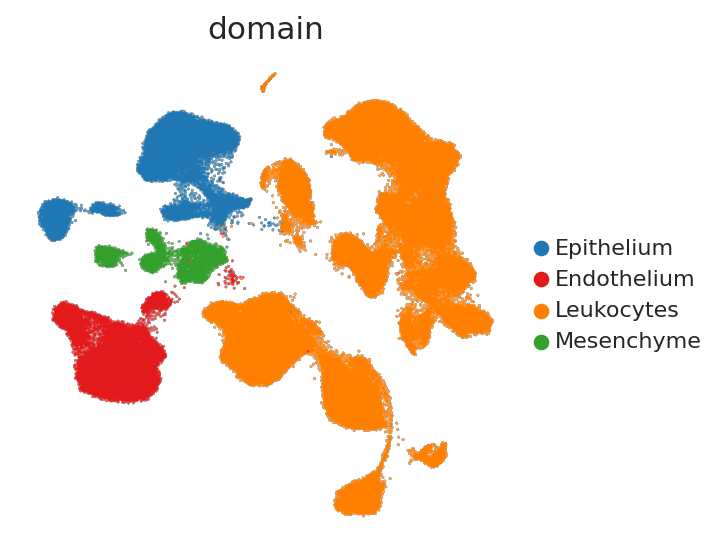

In [8]:
new_cols5={'Epithelium': '#1f78b4', 'Endothelium': '#e31a1c', 'Leukocytes': '#ff7f00', 'Mesenchyme': '#33a02c'}

order5 = ['Epithelium', 'Endothelium', 'Leukocytes','Mesenchyme']
label5 = "domain"
cols5= [new_cols5[ct] for ct in order5]

adata.obs['domain'] = adata.obs['domain'].cat.reorder_categories(order5)
adata.uns["%s_colors" %label5] = cols5
sc.pl.umap(adata, color = ["domain"],legend_fontsize=10, legend_fontweight='bold', legend_fontoutline=False, frameon=False,
           add_outline=True, outline_width=(0.05, 0.01), size=5)

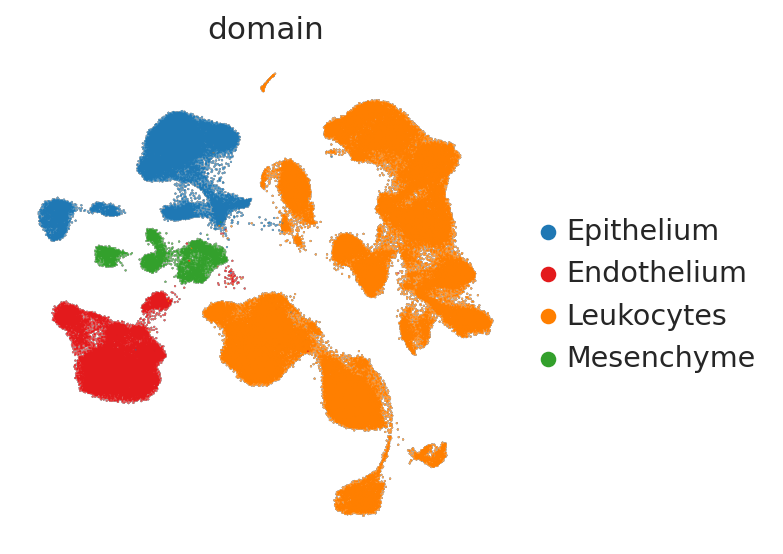

In [9]:
sc.pl.umap(adata, color = ["domain"], frameon=False, add_outline=True, 
           outline_width=(0.05, 0.01), size=3, ncols=1, 
           legend_loc= "right margin", legend_fontoutline=False, legend_fontweight="medium",
           save=("_whole_domain_with_legend.pdf"))

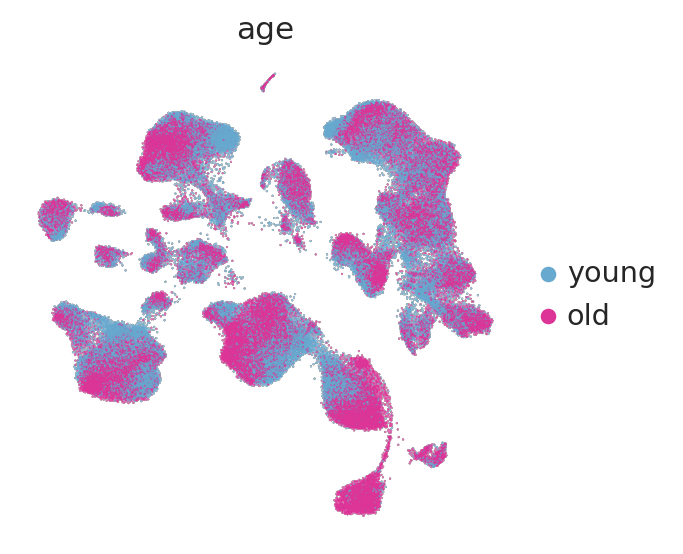

In [10]:
sc.pl.umap(adata, color = ["age"], frameon=False, add_outline=True, 
           outline_width=(0.05, 0.01), size=3, ncols=1, 
           legend_loc= "right margin", legend_fontoutline=False, legend_fontweight="medium",
           save=("_whole_age_with_legend.pdf"))

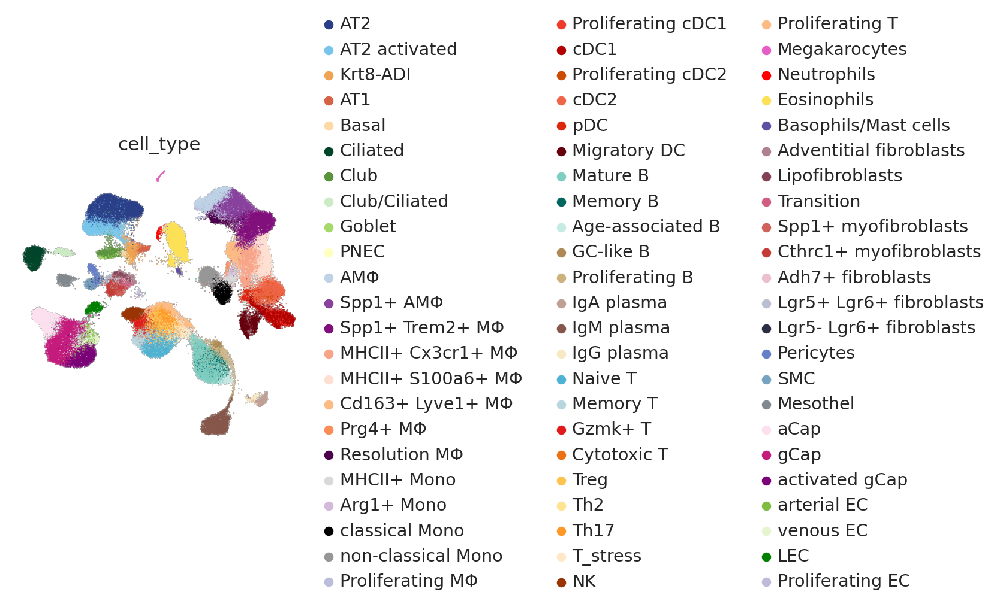

In [11]:
sc.pl.umap(adata, color = ["cell_type"], frameon=False, add_outline=True, 
           outline_width=(0.05, 0.01), size=3, ncols=1, 
           legend_loc= "right margin", legend_fontoutline=False, legend_fontweight="medium", 
           save=("_whole_ct_with_legend.pdf"))

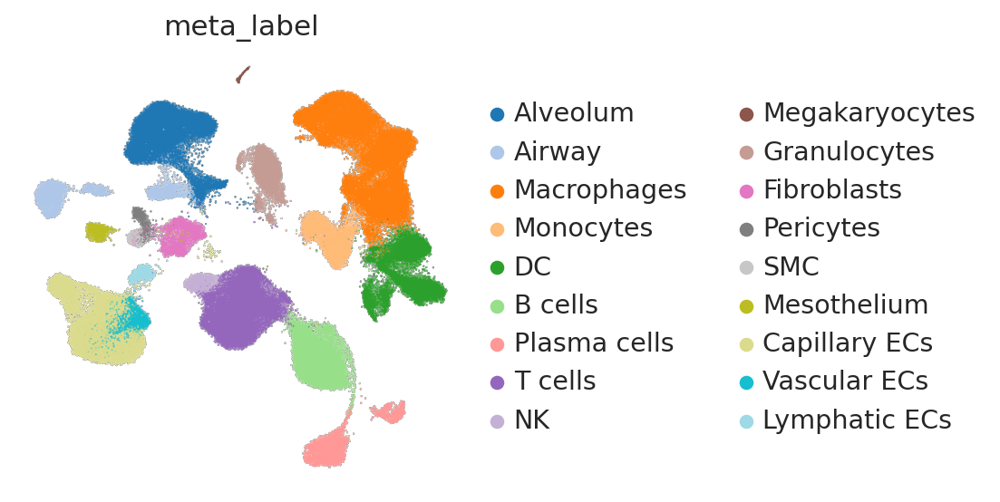

In [12]:
sc.pl.umap(adata, color = ["meta_label"], frameon=False, add_outline=True, 
           outline_width=(0.05, 0.01), size=3, ncols=1, 
           legend_loc= "right margin", legend_fontoutline=False, legend_fontweight="medium",  palette="tab20",
           save=("_whole_meta_ct_with_legend.pdf"))

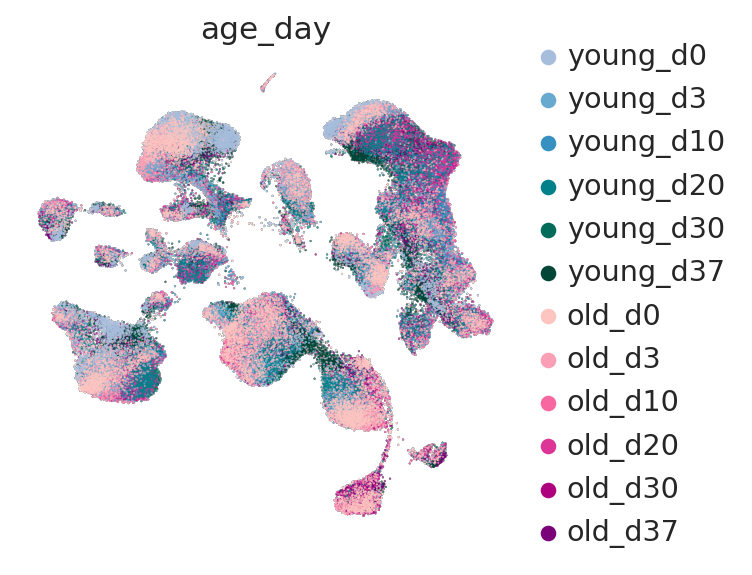

In [13]:
sc.pl.umap(adata, color = ["age_day"], frameon=False, add_outline=True, 
           outline_width=(0.05, 0.01), size=3, ncols=1, 
           legend_loc= "right margin", legend_fontoutline=False, legend_fontweight="medium", 
           save=("_whole_age_day.pdf"))

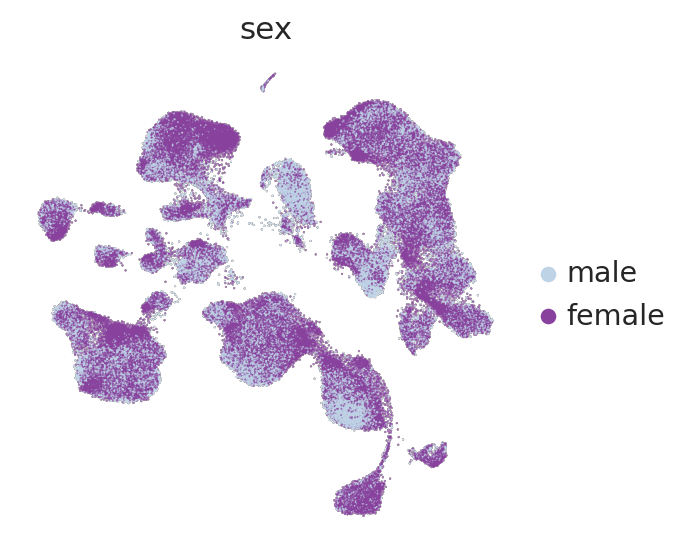

In [14]:
sc.pl.umap(adata, color = ["sex"], frameon=False, add_outline=True, 
           outline_width=(0.05, 0.01), size=3, ncols=1, 
           legend_loc= "right margin", legend_fontoutline=False, legend_fontweight="medium", 
           save=("_whole_sex.pdf"))

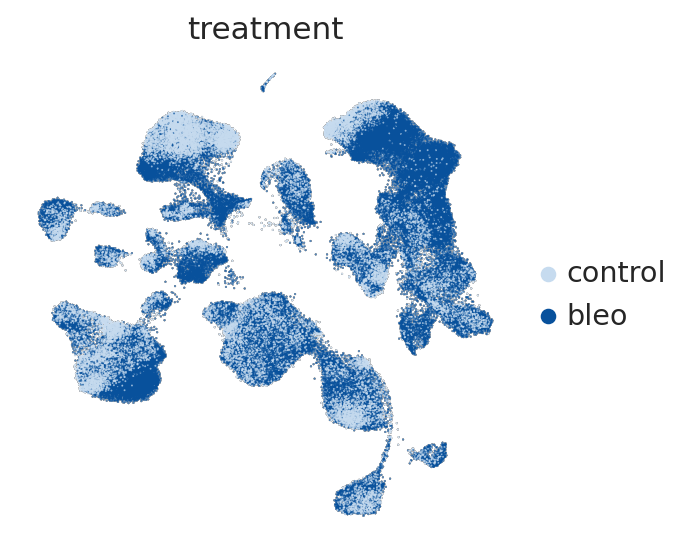

In [15]:
sc.pl.umap(adata, color = ["treatment"], frameon=False, add_outline=True, 
           outline_width=(0.05, 0.01), size=3, ncols=1, 
           legend_loc= "right margin", legend_fontoutline=False, legend_fontweight="medium", 
           save=("_whole_treatment.pdf"))

### Marker genes for Meta Label

In [16]:
plt.rcdefaults()
plt.rcParams['pdf.fonttype'] = 42

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_meta_label']`
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:03:22)


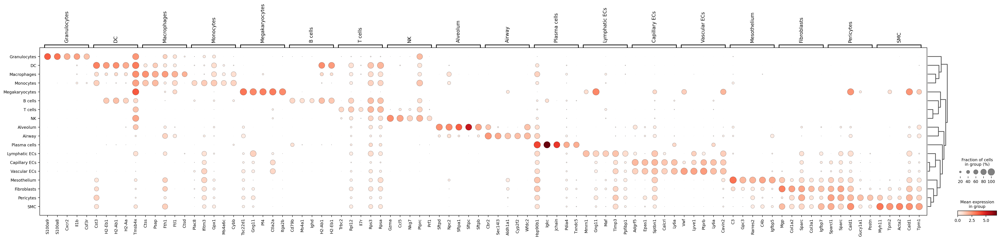

In [17]:
sc.tl.dendrogram(adata, 'meta_label')
sc.tl.rank_genes_groups(adata, groupby = "meta_label",method="wilcoxon")
sc.pl.rank_genes_groups_dotplot(adata, n_genes = 5)

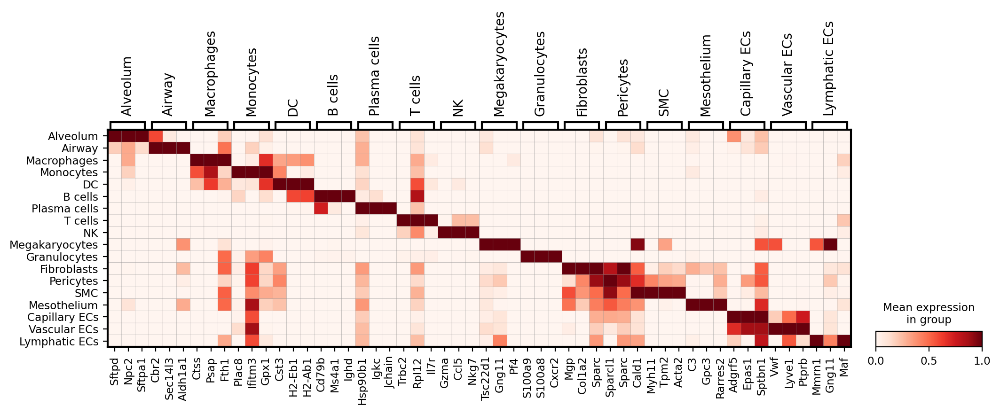

In [18]:
sc.pl.rank_genes_groups_matrixplot(adata, n_genes = 3, cmap="Reds",  standard_scale='var', dendrogram=False,
                                   swap_axes=False, figsize=(12,3), save=("_markerplot_meta_dendogram_whole.pdf"))

### Export overview plots for subcompartments

In [82]:
### load subsets
object_folder = "/media/HDD_1/Janine/Aging_SingleCell/data_objects/"
endo = sc.read(object_folder + "221006_BleoAging_Endothelium_final.h5ad")
alv =  sc.read(object_folder + "240812_BleoAging_Alveolum_final.h5ad") 
MNP =  sc.read(object_folder + "221006_BleoAging_MNP_final.h5ad")
mes =  sc.read(object_folder + "221006_BleoAging_Mesenchyme_final.h5ad") 

In [83]:
sc.set_figure_params(endo, vector_friendly=True, format='pdf', dpi_save=300, facecolor=None, transparent=False, ipython_format='png2x')
plt.rcParams['pdf.fonttype'] = 42

#### 1. Endothelium

In [84]:
xlabel = "age_day"
cell_type_label = "cell_type"
cols = endo.uns["%s_colors" %cell_type_label]
celltypes = endo.obs["cell_type"].cat.categories
order = endo.obs[xlabel].cat.categories.values

relFreqs = codes.calc_relFreq(endo, group_by = cell_type_label, xlabel = xlabel, condition = None)
relFreqs.head(10)

,aCap,gCap,activated gCap,arterial EC,venous EC,LEC,Proliferating EC,age_day
oBf-d10-M12,0.097938,0.395189,0.254296,0.041237,0.147766,0.032646,0.030928,old_d10
oBf-d21-M20,0.050000,0.047619,0.659524,0.023810,0.111905,0.083333,0.023810,old_d20
oBf-d3-M3,0.098004,0.611615,0.112523,0.018149,0.116152,0.032668,0.010889,old_d3
oBf-d42-M35,0.050847,0.656780,0.148305,0.025424,0.050847,0.059322,0.008475,old_d37
oBf-d42-M36,0.078740,0.624672,0.041995,0.018373,0.089239,0.144357,0.002625,old_d37
oBf_d10_M11,0.076923,0.307692,0.384615,0.024291,0.101215,0.048583,0.056680,old_d10
oBf_d21_M19,0.058419,0.068729,0.549828,0.010309,0.137457,0.068729,0.106529,old_d20
oBf_d28_M27,0.047210,0.506438,0.197425,0.012876,0.163090,0.047210,0.025751,old_d30
oBf_d28_M28,0.092166,0.373272,0.161290,0.027650,0.193548,0.152074,0.000000,old_d30
oBf_d3_M5,0.093264,0.601036,0.095855,0.038860,0.108808,0.020725,0.041451,old_d3


Saving Figure to /home/gotej/Projects/Aging_BleoModel/Paper_figures/figures/_RelFreq_endo_subset.pdf


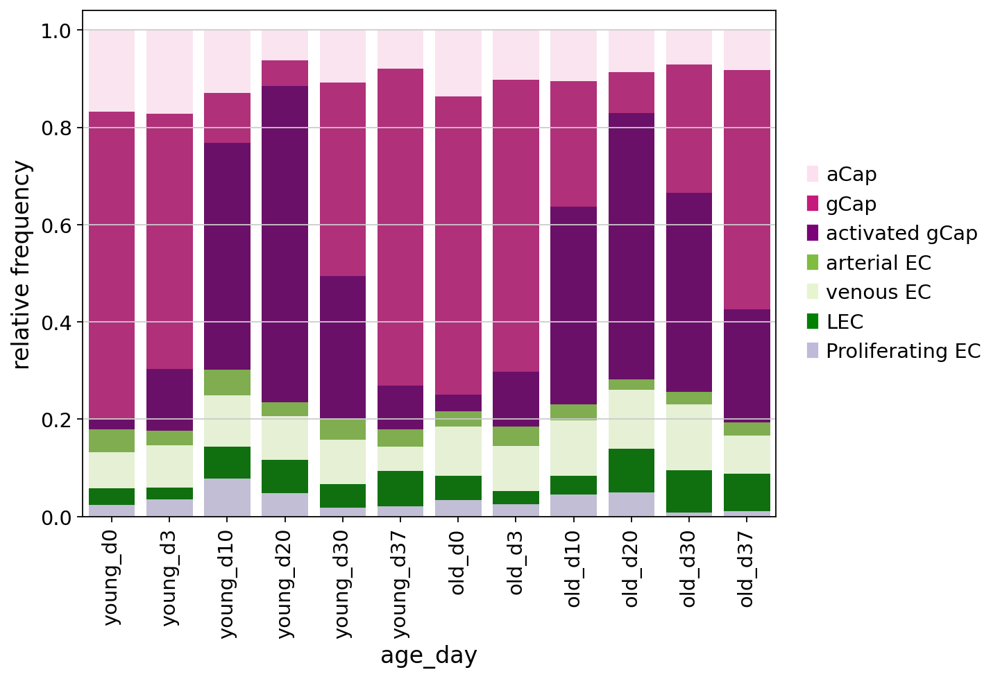

In [85]:
codes.plot_cluster_composition(relFreqs, xlabel = xlabel, figsize = (8, 6),
                               order=['young_d0','young_d3','young_d10', 'young_d20', 'young_d30', 'young_d37',
                                     'old_d0','old_d3','old_d10', 'old_d20', 'old_d30', 'old_d37'], cols=cols,
                               errbar = False, width = 0.8, 
                               save="/home/gotej/Projects/Aging_BleoModel/Paper_figures/figures/" + "_RelFreq_endo_subset.pdf") 

In [86]:
## Relative Frequencies split by condition by specifying Parameter condition
xlabel = "day"
group_by = "cell_type"
condition = "age"
cols = endo.uns["%s_colors" %condition]
order = endo.obs["day"].cat.categories 

relFreqs = codes.calc_relFreq(endo, group_by = group_by, xlabel = xlabel, condition = "age")
relFreqs.head(4)

,aCap,gCap,activated gCap,arterial EC,venous EC,LEC,Proliferating EC,day,age
oBf-d10-M12,0.097938,0.395189,0.254296,0.041237,0.147766,0.032646,0.030928,d10,old
oBf-d21-M20,0.050000,0.047619,0.659524,0.023810,0.111905,0.083333,0.023810,d20,old
oBf-d3-M3,0.098004,0.611615,0.112523,0.018149,0.116152,0.032668,0.010889,d3,old
oBf-d42-M35,0.050847,0.656780,0.148305,0.025424,0.050847,0.059322,0.008475,d37,old


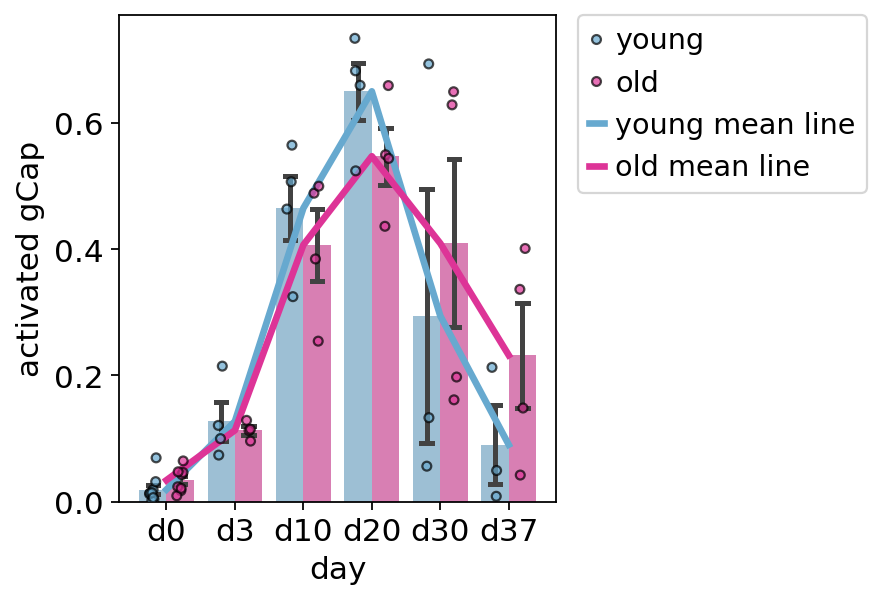

In [88]:
relFreqs = relFreqs.loc[relFreqs[xlabel].isin(order)]

fig, ax = plt.subplots()
fig.set_size_inches(3.5, 4)
ax.grid(visible=False)

sb.barplot(
    data=relFreqs,
    hue=condition,
    hue_order=['young', 'old'],
    x=xlabel,
    y="activated gCap",
    order=order,
    palette=cols,
    errorbar="se",
    dodge=True,
    capsize=0.3,
    alpha=0.7,
    ax=ax
)

sb.stripplot(
    data=relFreqs,
    hue=condition,
    hue_order=['young', 'old'],
    x=xlabel,
    y="activated gCap",
    order=order,
    palette=cols,
    dodge=True,
    edgecolor='black',
    linewidth=1.0,
    size=4,
    alpha=0.7,
    ax=ax
)

means = relFreqs.groupby([xlabel, condition])["activated gCap"].mean().reset_index()
means[xlabel] = pd.Categorical(means[xlabel], categories=order, ordered=True)
means = means.sort_values([condition, xlabel])
xlabel_to_position = {label: i for i, label in enumerate(order)}

# Define manual line colors
line_colors = {
    'young': '#67a9cf',
    'old': '#dd3497'
}

# Plot for each condition
for cond in ['young', 'old']:
    subset = means[means[condition] == cond]
    x_positions = np.array([xlabel_to_position[val] for val in subset[xlabel]])
    ax.plot(
        x_positions,
        subset["activated gCap"].values,
        linestyle='-',
        linewidth=3,
        color=line_colors[cond],   # <-- use manual color
        label=f"{cond} mean line"
    )

handles, labels = ax.get_legend_handles_labels()
unique = dict(zip(labels, handles))
ax.legend(unique.values(), unique.keys(), bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.savefig("/home/gotej/Projects/Aging_BleoModel/Paper_figures/figures/" + "_rel_freq_activated_gCap.pdf")



In [89]:
cols = endo.uns["%s_colors" %condition]
print(cols)

['#67a9cf' '#dd3497']


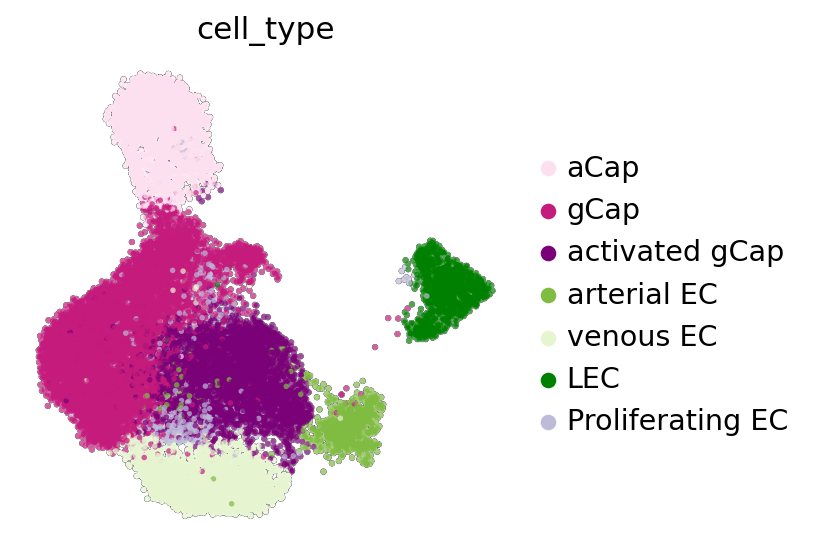

In [93]:
sc.pl.umap(endo, color = ["cell_type"], frameon=False, add_outline=True, 
           outline_width=(0.05, 0.01), size=25, ncols=1, 
           legend_loc= "right margin", 
           save=("_Endo_ct_with_legend.pdf"))

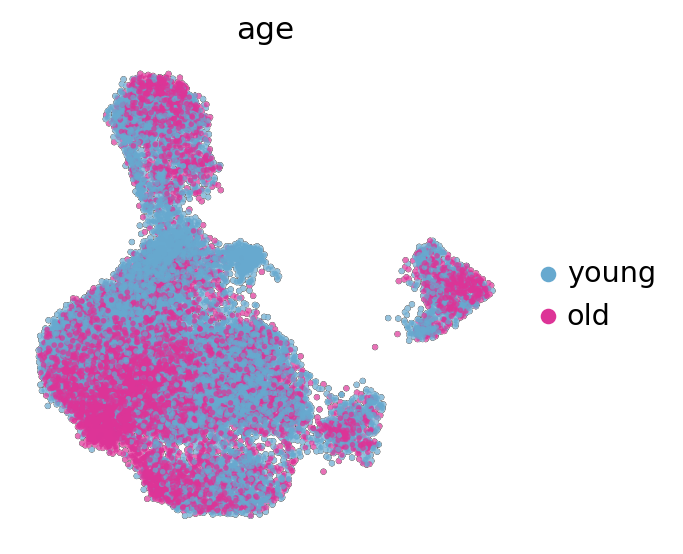

In [94]:
sc.pl.umap(endo, color = ["age"], frameon=False, add_outline=True, 
           outline_width=(0.05, 0.01), size=25, ncols=1, 
           legend_loc= "right margin", 
           save=("_Endo_age_with_legend.pdf"))

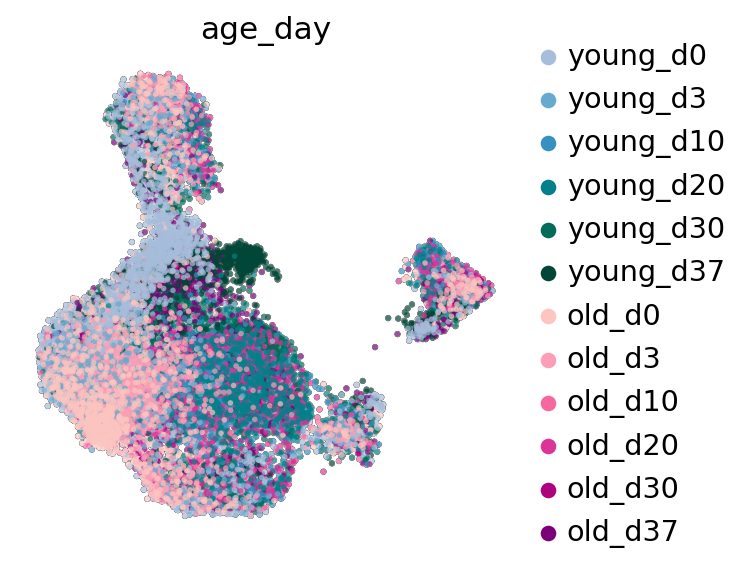

In [95]:
sc.pl.umap(endo, color = ["age_day"], frameon=False, add_outline=True, 
           outline_width=(0.05, 0.01), size=25, ncols=1, 
           legend_loc= "right margin", 
           save=("_Endo_age_day_with_legend.pdf"))

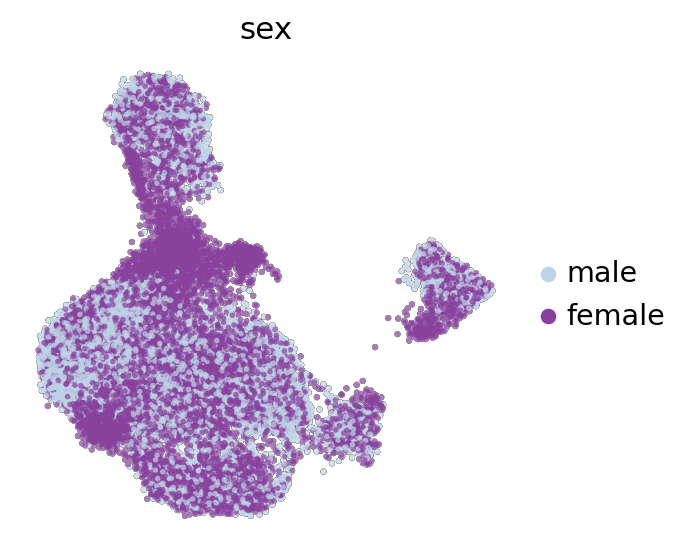

In [96]:
sc.pl.umap(endo, color = ["sex"], frameon=False, add_outline=True, 
           outline_width=(0.05, 0.01), size=25, ncols=1, 
           legend_loc= "right margin", 
           save=("_Endo_sex_with_legend.pdf"))

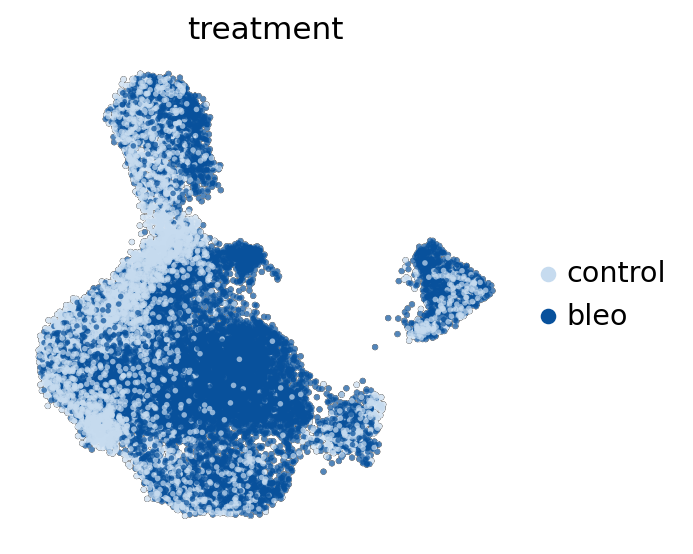

In [97]:
sc.pl.umap(endo, color = ["treatment"], frameon=False, add_outline=True, 
           outline_width=(0.05, 0.01), size=25, ncols=1, 
           legend_loc= "right margin", 
           save=("_Endo_treatment_with_legend.pdf"))

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_cell_type']`
categories: aCap, gCap, activated gCap, etc.
var_group_labels: activated gCap, arterial EC, venous EC, etc.


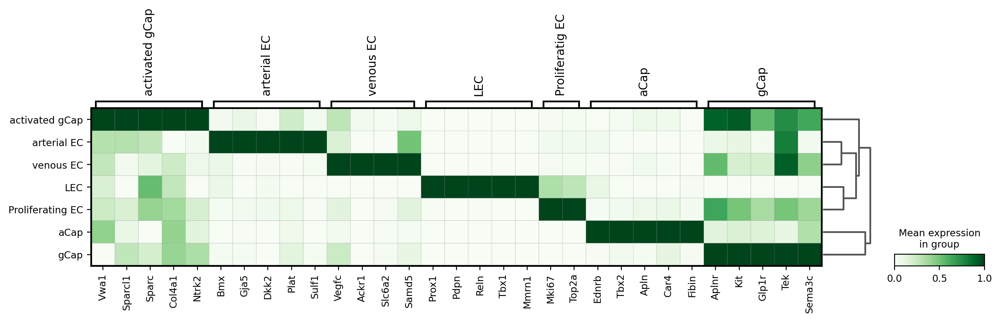

In [98]:
plt.rcdefaults()
plt.rcParams['pdf.fonttype'] = 42

## custom heatmap
celltype_markers={'activated gCap' : ["Vwa1",'Sparcl1', "Sparc", 'Col4a1', "Ntrk2"],
                  'arterial EC' : ['Bmx','Gja5','Dkk2', 'Plat', "Sulf1"],
                  'venous EC' : ['Vegfc','Ackr1', "Slc6a2", 'Samd5'],
                  'LEC' : ['Prox1','Pdpn', 'Reln','Tbx1', 'Mmrn1'],
                  'Proliferatig EC' : ['Mki67','Top2a'], 
                  'aCap' : ['Ednrb','Tbx2','Apln', 'Car4', 'Fibin'],
                  'gCap' : ['Aplnr', 'Kit', "Glp1r", 'Tek', 'Sema3c'],
                  }

sc.tl.dendrogram(endo, 'cell_type')
sc.pl.matrixplot(endo, celltype_markers, groupby = 'cell_type', standard_scale='var', dendrogram=True, 
                 cmap="Greens", save=("_markerplot_horizontal_dendogram_Endothelium.pdf"))

#### 2. Mesenchyme

In [99]:
sc.set_figure_params(mes, vector_friendly=True, format='pdf', dpi_save=300, facecolor=None, transparent=False, ipython_format='png2x')

In [100]:
xlabel = "age_day"
cell_type_label = "cell_type"
cols = mes.uns["%s_colors" %cell_type_label]
celltypes = mes.obs["cell_type"].cat.categories
order = mes.obs[xlabel].cat.categories.values

relFreqs = codes.calc_relFreq(mes, group_by = cell_type_label, xlabel = xlabel, condition = None)
relFreqs.head(10)

,Adventitial fibroblasts,Lipofibroblasts,Transition,Spp1+ myofibroblasts,Cthrc1+ myofibroblasts,Adh7+ fibroblasts,Lgr5+ Lgr6+ fibroblasts,Lgr5- Lgr6+ fibroblasts,Pericytes,SMC,Mesothel,age_day
oBf-d10-M12,0.029126,0.097087,0.077670,0.048544,0.087379,0.029126,0.009709,0.029126,0.242718,0.097087,0.252427,old_d10
oBf-d21-M20,0.081481,0.007407,0.125926,0.103704,0.407407,0.007407,0.007407,0.022222,0.074074,0.081481,0.081481,old_d20
oBf-d3-M3,0.076923,0.145299,0.017094,0.000000,0.000000,0.076923,0.068376,0.017094,0.350427,0.128205,0.119658,old_d3
oBf-d42-M35,0.111111,0.288889,0.000000,0.044444,0.177778,0.000000,0.044444,0.000000,0.088889,0.044444,0.200000,old_d37
oBf-d42-M36,0.163043,0.184783,0.000000,0.010870,0.054348,0.021739,0.043478,0.000000,0.130435,0.086957,0.304348,old_d37
oBf_d10_M11,0.032258,0.016129,0.112903,0.064516,0.129032,0.032258,0.048387,0.032258,0.161290,0.096774,0.274194,old_d10
oBf_d21_M19,0.101449,0.000000,0.057971,0.086957,0.318841,0.000000,0.014493,0.000000,0.072464,0.072464,0.275362,old_d20
oBf_d28_M27,0.069767,0.139535,0.023256,0.000000,0.093023,0.069767,0.116279,0.023256,0.093023,0.069767,0.302326,old_d30
oBf_d28_M28,0.068966,0.206897,0.017241,0.034483,0.068966,0.086207,0.068966,0.017241,0.086207,0.120690,0.224138,old_d30
oBf_d3_M5,0.103093,0.113402,0.051546,0.000000,0.020619,0.082474,0.020619,0.010309,0.154639,0.247423,0.195876,old_d3


Saving Figure to /home/gotej/Projects/Aging_BleoModel/Paper_figures/figures/_RelFreq_mesenchyme_subset.pdf


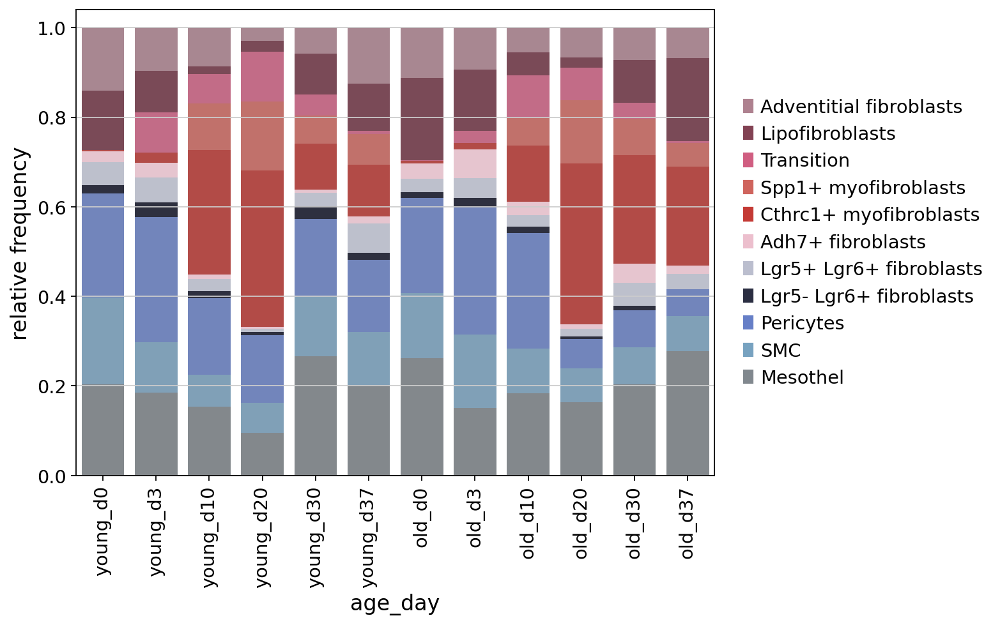

In [101]:
codes.plot_cluster_composition(relFreqs, xlabel = xlabel, figsize = (8, 6),
                               order=['young_d0','young_d3','young_d10', 'young_d20', 'young_d30', 'young_d37',
                                     'old_d0','old_d3','old_d10', 'old_d20', 'old_d30', 'old_d37'], cols=cols,
                               errbar = False, width = 0.8, 
                               save="/home/gotej/Projects/Aging_BleoModel/Paper_figures/figures/" + "_RelFreq_mesenchyme_subset.pdf") 

In [102]:
## Relative Frequencies split by condition by specifying Parameter condition
xlabel = "day"
group_by = "cell_type"
condition = "age"
cols = mes.uns["%s_colors" %condition]
order = mes.obs["day"].cat.categories 

relFreqs = codes.calc_relFreq(mes, group_by = group_by, xlabel = xlabel, condition = "age")
relFreqs.head(4)

,Adventitial fibroblasts,Lipofibroblasts,Transition,Spp1+ myofibroblasts,Cthrc1+ myofibroblasts,Adh7+ fibroblasts,Lgr5+ Lgr6+ fibroblasts,Lgr5- Lgr6+ fibroblasts,Pericytes,SMC,Mesothel,day,age
oBf-d10-M12,0.029126,0.097087,0.077670,0.048544,0.087379,0.029126,0.009709,0.029126,0.242718,0.097087,0.252427,d10,old
oBf-d21-M20,0.081481,0.007407,0.125926,0.103704,0.407407,0.007407,0.007407,0.022222,0.074074,0.081481,0.081481,d20,old
oBf-d3-M3,0.076923,0.145299,0.017094,0.000000,0.000000,0.076923,0.068376,0.017094,0.350427,0.128205,0.119658,d3,old
oBf-d42-M35,0.111111,0.288889,0.000000,0.044444,0.177778,0.000000,0.044444,0.000000,0.088889,0.044444,0.200000,d37,old


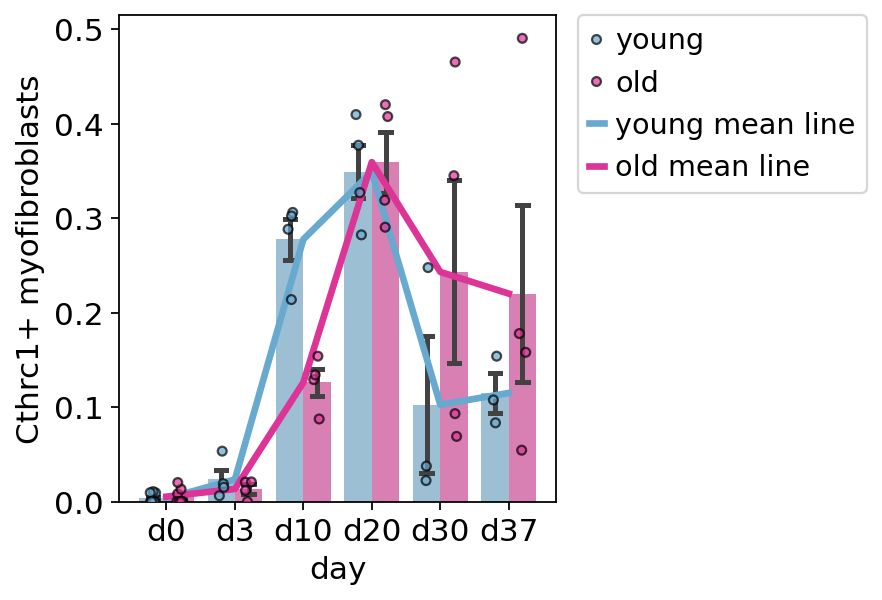

In [106]:
relFreqs = relFreqs.loc[relFreqs[xlabel].isin(order)]

fig, ax = plt.subplots()
fig.set_size_inches(3.5, 4)
ax.grid(visible=False)

sb.barplot(
    data=relFreqs,
    hue=condition,
    hue_order=['young', 'old'],
    x=xlabel,
    y="Cthrc1+ myofibroblasts",
    order=order,
    palette=cols,
    errorbar="se",
    dodge=True,
    capsize=0.3,
    alpha=0.7,
    ax=ax
)

sb.stripplot(
    data=relFreqs,
    hue=condition,
    hue_order=['young', 'old'],
    x=xlabel,
    y="Cthrc1+ myofibroblasts",
    order=order,
    palette=cols,
    dodge=True,
    edgecolor='black',
    linewidth=1.0,
    size=4,
    alpha=0.7,
    ax=ax
)

means = relFreqs.groupby([xlabel, condition])["Cthrc1+ myofibroblasts"].mean().reset_index()
means[xlabel] = pd.Categorical(means[xlabel], categories=order, ordered=True)
means = means.sort_values([condition, xlabel])
xlabel_to_position = {label: i for i, label in enumerate(order)}

# Define manual line colors
line_colors = {
    'young': '#67a9cf',
    'old': '#dd3497'
}

# Plot for each condition
for cond in ['young', 'old']:
    subset = means[means[condition] == cond]
    x_positions = np.array([xlabel_to_position[val] for val in subset[xlabel]])
    ax.plot(
        x_positions,
        subset["Cthrc1+ myofibroblasts"].values,
        linestyle='-',
        linewidth=3,
        color=line_colors[cond],   # <-- use manual color
        label=f"{cond} mean line"
    )

handles, labels = ax.get_legend_handles_labels()
unique = dict(zip(labels, handles))
ax.legend(unique.values(), unique.keys(), bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.savefig("/home/gotej/Projects/Aging_BleoModel/Paper_figures/figures/" + "_rel_freq_Ctrhc1+_Myofibroblasts.pdf")


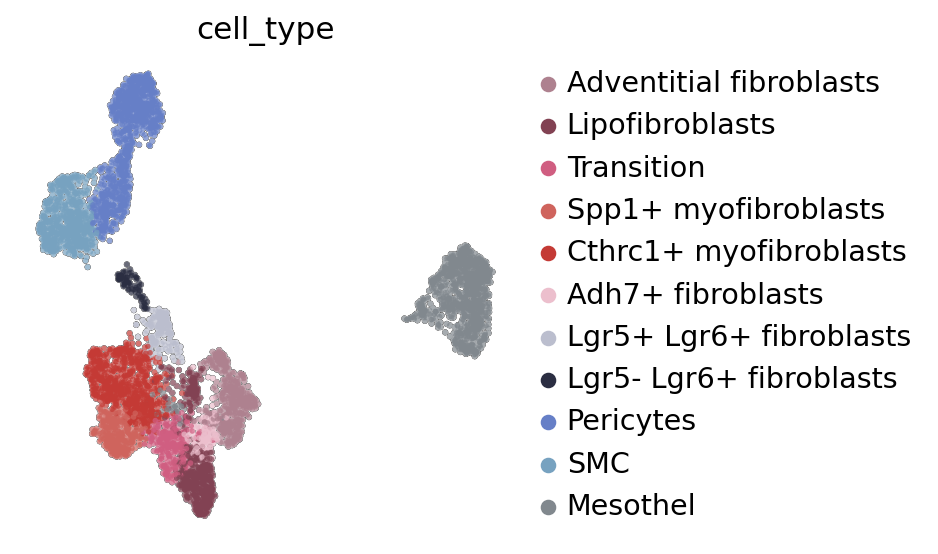

In [110]:
sc.pl.umap(mes, color = ["cell_type"], frameon=False, add_outline=True, 
           outline_width=(0.05, 0.01), size=25, ncols=1, 
           legend_loc= "right margin", 
           save=("_Mes_ct_with_legend.pdf"))

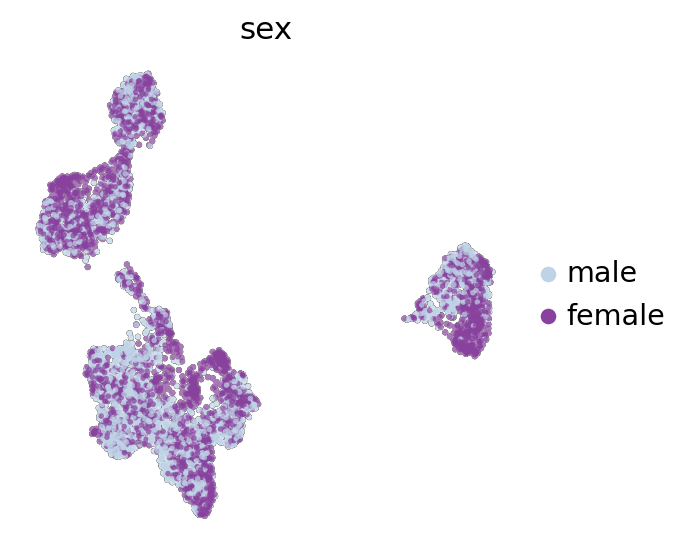

In [111]:
sc.pl.umap(mes, color = ["sex"], frameon=False, add_outline=True, 
           outline_width=(0.05, 0.01), size=25, ncols=1, 
           legend_loc= "right margin", 
           save=("_Mes_sex_with_legend.pdf"))

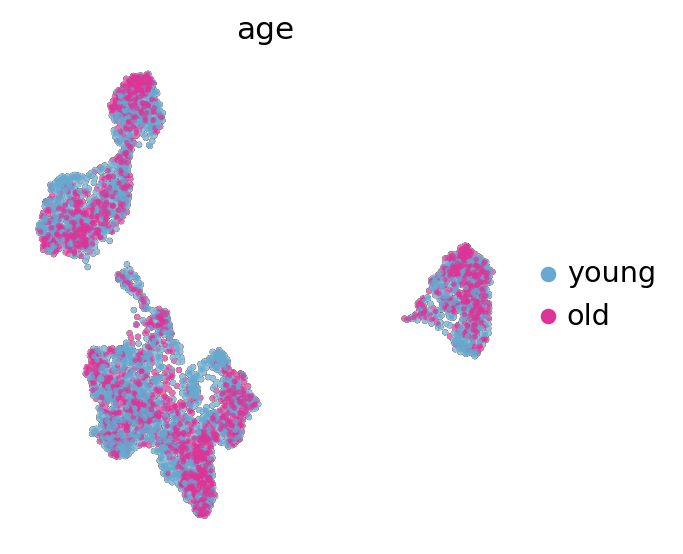

In [112]:
sc.pl.umap(mes, color = ["age"], frameon=False, add_outline=True, 
           outline_width=(0.05, 0.01), size=25, ncols=1, 
           legend_loc= "right margin", 
           save=("_Mes_age_with_legend.pdf"))

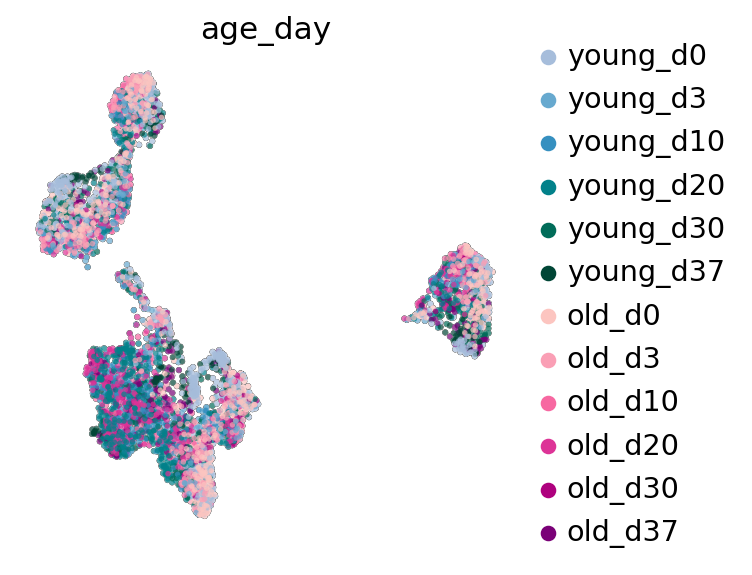

In [113]:
sc.pl.umap(mes, color = ["age_day"], frameon=False, add_outline=True, 
           outline_width=(0.05, 0.01), size=25, ncols=1, 
           legend_loc= "right margin", 
           save=("_Mes_age_day_with_legend.pdf"))

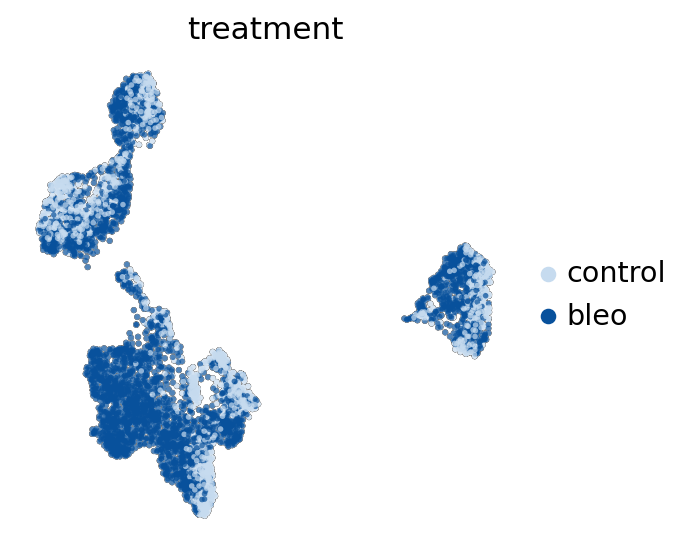

In [114]:
sc.pl.umap(mes, color = ["treatment"], frameon=False, add_outline=True, 
           outline_width=(0.05, 0.01), size=25, ncols=1, 
           legend_loc= "right margin", 
           save=("_Mes_treatment_with_legend.pdf"))

    using 'X_pca' with n_pcs = 40
Storing dendrogram info using `.uns['dendrogram_cell_type']`


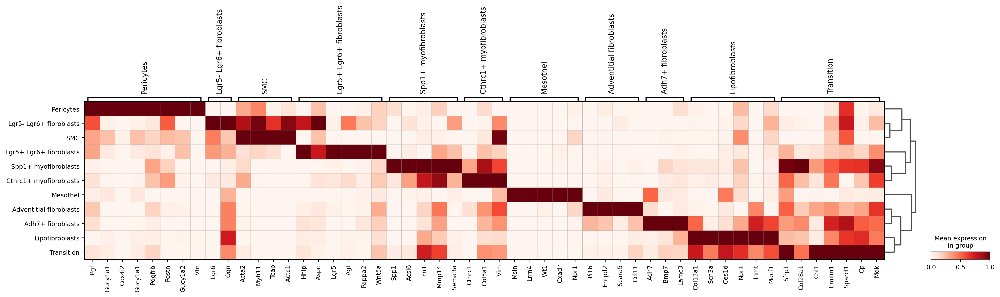

In [115]:
plt.rcdefaults()
plt.rcParams['pdf.fonttype'] = 42

## custom heatmap
celltype_markers={'Adh7+ fibroblasts' : ['Adh7','Bmp7','Lamc3'],
                  'Adventitial fibroblasts' : ['Pi16','Entpd2','Scara5','Ccl11'],
                  'Cthrc1+ myofibroblasts' : ['Cthrc1','Col5a1', "Vim"],
                  'Lgr5- Lgr6+ fibroblasts' : ['Lgr6', "Ogn"],
                  'Lipofibroblasts' : ['Col13a1','Scn3a','Ces1d', "Npnt",'Inmt', 'Macf1'],
                  'Mesothel' : ['Msln', 'Lrrn4','Wt1','Cxadr','Npr1'],
                  'Lgr5+ Lgr6+ fibroblasts' : ['Hhip','Aspn', "Lgr5", "Agt", "Pappa2", "Wnt5a"],
                  'Pericytes' : ['Pgf','Gucy1a1', "Cox4i2",'Gucy1a1', 'Pdgfrb', 'Postn', 'Gucy1a2', 'Vtn'],
                  'SMC' : ['Acta2','Myh11','Tcap', "Actc1"],
                  'Spp1+ myofibroblasts' : ['Spp1', 'Acsl6','Fn1','Mmp14', "Sema3a"],
                  'Transition' : ['Sfrp1', 'Col28a1', 'Chl1','Emilin1', 'Sparcl1', "Cp", "Mdk"],
                 }

sc.tl.dendrogram(mes, 'cell_type')                
sc.pl.matrixplot(mes, celltype_markers, groupby = 'cell_type', standard_scale='var', dendrogram=True,
                 cmap="Reds", save=("_markerplot_horizontal_dendogram_Mesenchyme.pdf"))

#### 3. Alv Epi

In [116]:
sc.set_figure_params(alv, vector_friendly=True, format='pdf', dpi_save=300, facecolor=None, transparent=False, ipython_format='png2x')
plt.rcParams['pdf.fonttype'] = 42

In [117]:
xlabel = "age_day"
cell_type_label = "cell_type"
cols = alv.uns["%s_colors" %cell_type_label]
celltypes = alv.obs["cell_type"].cat.categories
order = alv.obs[xlabel].cat.categories.values

relFreqs = codes.calc_relFreq(alv, group_by = cell_type_label, xlabel = xlabel, condition = None)
relFreqs.head(10)

,AT2,AT2 activated,Krt8-ADI,AT1,age_day
oBf-d10-M12,0.103448,0.787356,0.103448,0.005747,old_d10
oBf-d21-M20,0.059880,0.670659,0.203593,0.065868,old_d20
oBf-d3-M3,0.097345,0.845133,0.037611,0.019912,old_d3
oBf-d42-M35,0.594340,0.169811,0.056604,0.179245,old_d37
oBf-d42-M36,0.796562,0.148997,0.031519,0.022923,old_d37
oBf_d10_M11,0.089552,0.656716,0.194030,0.059701,old_d10
oBf_d21_M19,0.060000,0.540000,0.320000,0.080000,old_d20
oBf_d28_M27,0.254237,0.627119,0.101695,0.016949,old_d30
oBf_d28_M28,0.250000,0.690217,0.048913,0.010870,old_d30
oBf_d3_M5,0.059289,0.869565,0.059289,0.011858,old_d3


Saving Figure to /home/gotej/Projects/Aging_BleoModel/Paper_figures/figures/_RelFreq_alveolar_subset.pdf


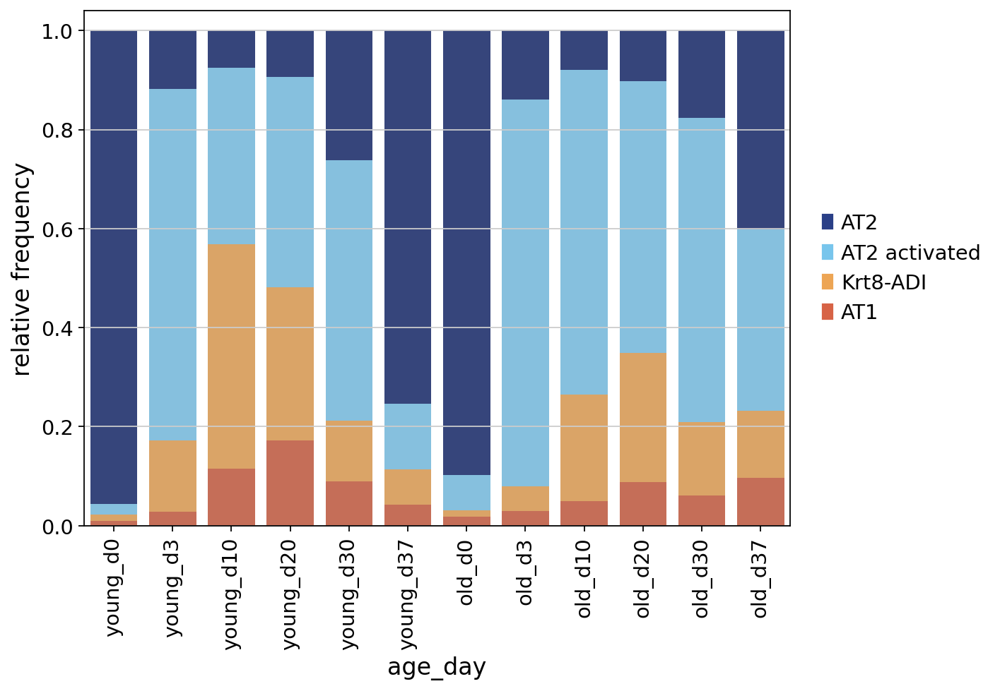

In [118]:
codes.plot_cluster_composition(relFreqs, xlabel = xlabel, figsize = (8, 6),
                               order=['young_d0','young_d3','young_d10', 'young_d20', 'young_d30', 'young_d37',
                                     'old_d0','old_d3','old_d10', 'old_d20', 'old_d30', 'old_d37'], cols=cols,
                               errbar = False, width = 0.8, 
                               save="/home/gotej/Projects/Aging_BleoModel/Paper_figures/figures/" + "_RelFreq_alveolar_subset.pdf") 

In [119]:
## Relative Frequencies split by condition by specifying Parameter condition
xlabel = "day"
group_by = "cell_type"
condition = "age"
cols = alv.uns["%s_colors" %condition]
order = alv.obs["day"].cat.categories 

relFreqs = codes.calc_relFreq(alv, group_by = group_by, xlabel = xlabel, condition = "age")
relFreqs.head(4)

,AT2,AT2 activated,Krt8-ADI,AT1,day,age
oBf-d10-M12,0.103448,0.787356,0.103448,0.005747,d10,old
oBf-d21-M20,0.059880,0.670659,0.203593,0.065868,d20,old
oBf-d3-M3,0.097345,0.845133,0.037611,0.019912,d3,old
oBf-d42-M35,0.594340,0.169811,0.056604,0.179245,d37,old


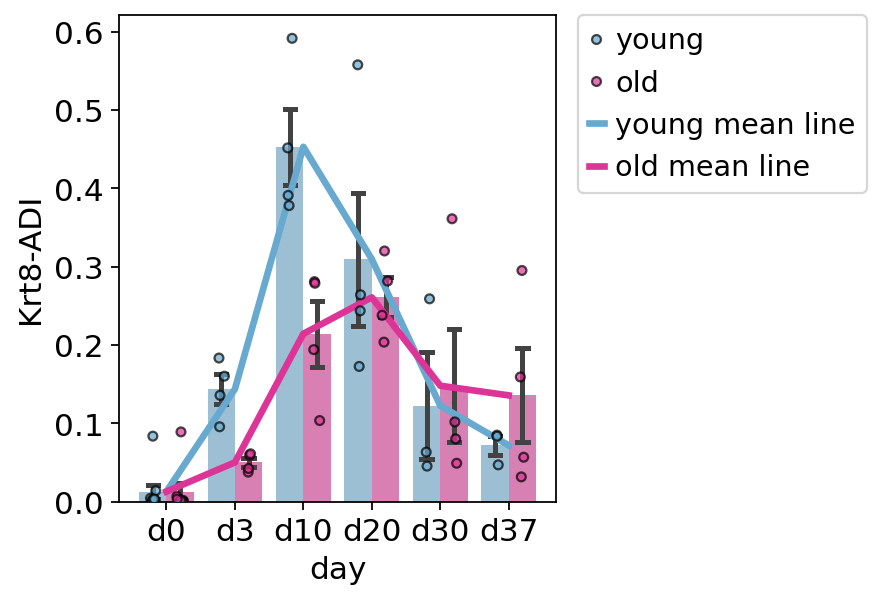

In [121]:
relFreqs = relFreqs.loc[relFreqs[xlabel].isin(order)]

fig, ax = plt.subplots()
fig.set_size_inches(3.5, 4)
ax.grid(visible=False)

sb.barplot(
    data=relFreqs,
    hue=condition,
    hue_order=['young', 'old'],
    x=xlabel,
    y="Krt8-ADI",
    order=order,
    palette=cols,
    errorbar="se",
    dodge=True,
    capsize=0.3,
    alpha=0.7,
    ax=ax
)

sb.stripplot(
    data=relFreqs,
    hue=condition,
    hue_order=['young', 'old'],
    x=xlabel,
    y="Krt8-ADI",
    order=order,
    palette=cols,
    dodge=True,
    edgecolor='black',
    linewidth=1.0,
    size=4,
    alpha=0.7,
    ax=ax
)

means = relFreqs.groupby([xlabel, condition])["Krt8-ADI"].mean().reset_index()
means[xlabel] = pd.Categorical(means[xlabel], categories=order, ordered=True)
means = means.sort_values([condition, xlabel])
xlabel_to_position = {label: i for i, label in enumerate(order)}

# Define manual line colors
line_colors = {
    'young': '#67a9cf',
    'old': '#dd3497'
}

# Plot for each condition
for cond in ['young', 'old']:
    subset = means[means[condition] == cond]
    x_positions = np.array([xlabel_to_position[val] for val in subset[xlabel]])
    ax.plot(
        x_positions,
        subset["Krt8-ADI"].values,
        linestyle='-',
        linewidth=3,
        color=line_colors[cond],   # <-- use manual color
        label=f"{cond} mean line"
    )

handles, labels = ax.get_legend_handles_labels()
unique = dict(zip(labels, handles))
ax.legend(unique.values(), unique.keys(), bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.savefig("/home/gotej/Projects/Aging_BleoModel/Paper_figures/figures/" + "_rel_freq_Krt8-ADI.pdf")


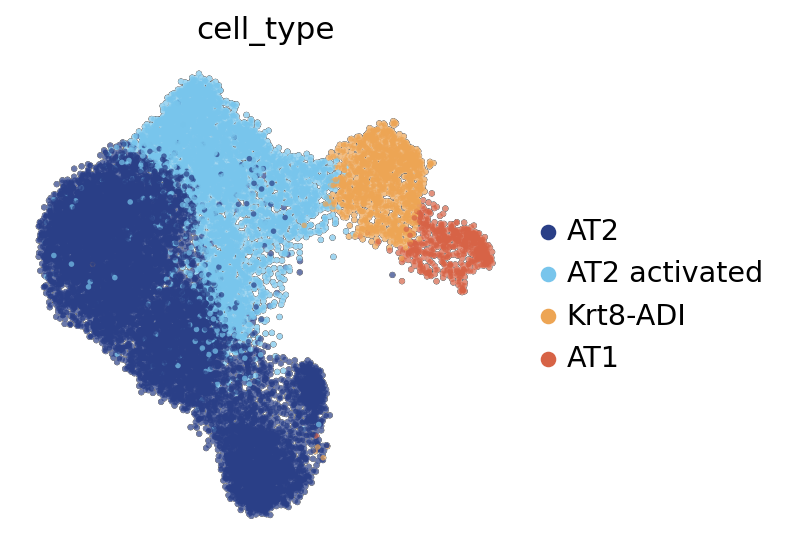

In [129]:
sc.pl.umap(alv, color = ["cell_type"], frameon=False, add_outline=True, 
           outline_width=(0.05, 0.01), size=25, ncols=1, 
           legend_loc= "right margin", 
           save=("_Alv_ct_with_legend.pdf"))

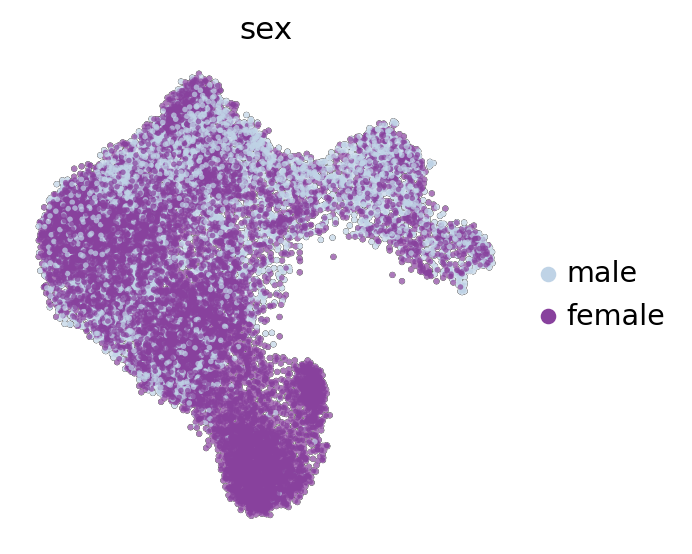

In [130]:
sc.pl.umap(alv, color = ["sex"], frameon=False, add_outline=True, 
           outline_width=(0.05, 0.01), size=25, ncols=1, 
           legend_loc= "right margin", 
           save=("_Alv_sex_with_legend.pdf"))

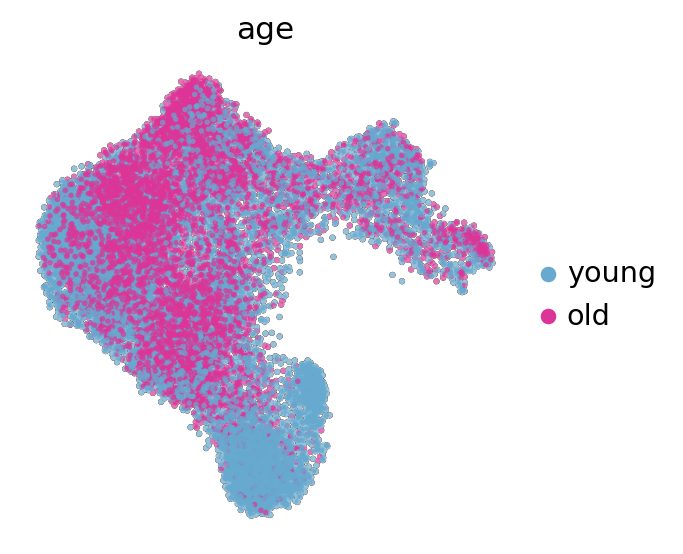

In [131]:
sc.pl.umap(alv, color = ["age"], frameon=False, add_outline=True, 
           outline_width=(0.05, 0.01), size=25, ncols=1, 
           legend_loc= "right margin", 
           save=("_Alv_age_with_legend.pdf"))

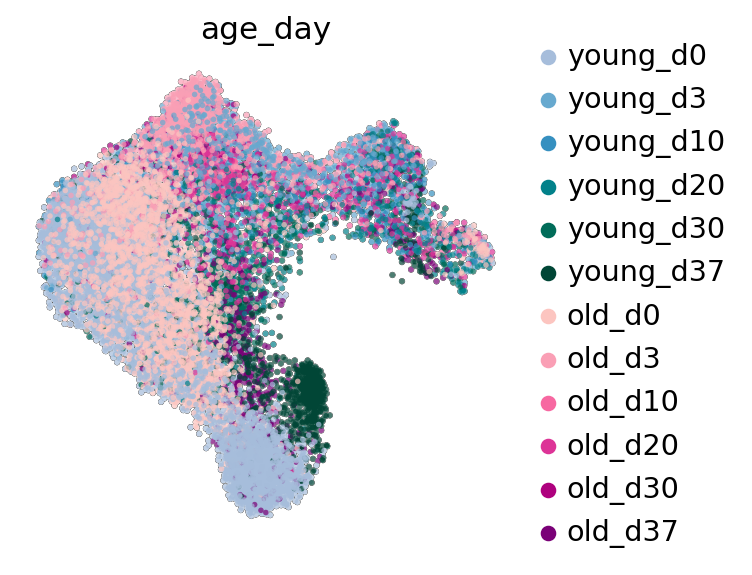

In [132]:
sc.pl.umap(alv, color = ["age_day"], frameon=False, add_outline=True, 
           outline_width=(0.05, 0.01), size=25, ncols=1, 
           legend_loc= "right margin", 
           save=("_Alv_age_day_with_legend.pdf"))

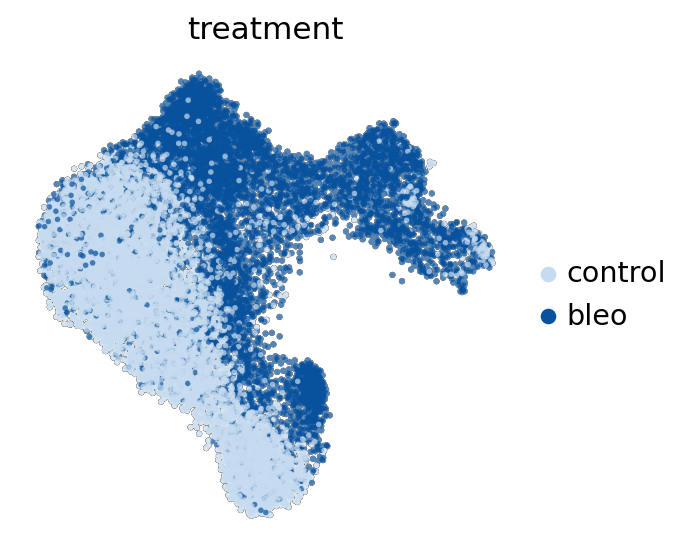

In [133]:
sc.pl.umap(alv, color = ["treatment"], frameon=False, add_outline=True, 
           outline_width=(0.05, 0.01), size=25, ncols=1, 
           legend_loc= "right margin", 
           save=("_Alv_treatment_day_with_legend.pdf"))

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_cell_type']`


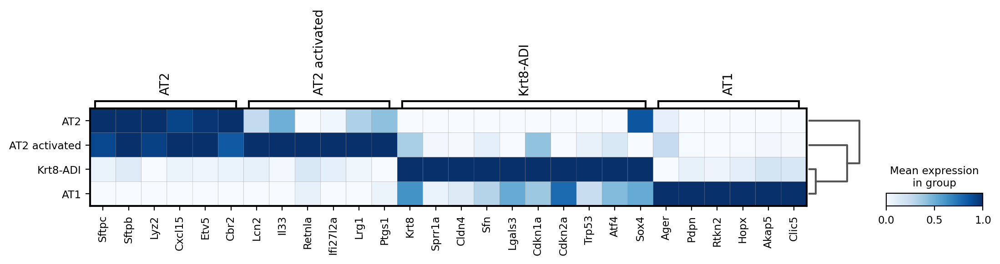

In [134]:
plt.rcdefaults()
plt.rcParams['pdf.fonttype'] = 42
celltype_markers={'AT2' : ['Sftpc', 'Sftpb', 'Lyz2', 'Cxcl15', 'Etv5','Cbr2'],
                  'AT2 activated' : ['Lcn2','Il33','Retnla','Ifi27l2a','Lrg1','Ptgs1'],
                  'Krt8-ADI' : ['Krt8','Sprr1a','Cldn4','Sfn','Lgals3','Cdkn1a','Cdkn2a','Trp53','Atf4','Sox4'],
                  'AT1' : ['Ager','Pdpn','Rtkn2','Hopx','Akap5','Clic5']}
sc.tl.dendrogram(alv, 'cell_type')
sc.pl.matrixplot(alv, celltype_markers, groupby = 'cell_type', standard_scale='var', dendrogram=True, swap_axes=False,
                 cmap="Blues", save=("_markerplot_horizontal_dendogram_Alveolum.pdf"))

#### 4. MNP

In [135]:
sc.set_figure_params(MNP, vector_friendly=True, format='pdf', dpi_save=300, facecolor=None, transparent=False, ipython_format='png2x')
plt.rcParams['pdf.fonttype'] = 42

In [136]:
xlabel = "age_day"
cell_type_label = "cell_type"
cols = MNP.uns["%s_colors" %cell_type_label]
celltypes = MNP.obs["cell_type"].cat.categories
order = MNP.obs[xlabel].cat.categories.values

relFreqs = codes.calc_relFreq(MNP, group_by = cell_type_label, xlabel = xlabel, condition = None)
relFreqs.head(10)

,AΜΦ,Spp1+ AΜΦ,Spp1+ Trem2+ ΜΦ,MHCII+ Cx3cr1+ ΜΦ,MHCII+ S100a6+ ΜΦ,Cd163+ Lyve1+ ΜΦ,Prg4+ ΜΦ,Resolution ΜΦ,MHCII+ Mono,Arg1+ Mono,classical Mono,non-classical Mono,Proliferating ΜΦ,Proliferating cDC1,cDC1,Proliferating cDC2,cDC2,pDC,Migratory DC,age_day
oBf-d10-M12,0.002235,0.053631,0.159777,0.110615,0.160894,0.051397,0.002235,0.006704,0.017877,0.000000,0.051397,0.075978,0.004469,0.021229,0.100559,0.014525,0.094972,0.005587,0.065922,old_d10
oBf-d21-M20,0.014914,0.220731,0.183445,0.110365,0.075317,0.043997,0.002237,0.008949,0.010440,0.003729,0.009694,0.006711,0.051454,0.019389,0.075317,0.014169,0.104400,0.008203,0.036540,old_d20
oBf-d3-M3,0.088083,0.127807,0.044905,0.112263,0.145078,0.051813,0.003454,0.000000,0.022453,0.000000,0.062176,0.081174,0.000000,0.031088,0.039724,0.024180,0.100173,0.018998,0.046632,old_d3
oBf-d42-M35,0.031674,0.045249,0.061840,0.218703,0.027149,0.022624,0.000000,0.276018,0.003017,0.000000,0.010558,0.012066,0.016591,0.019608,0.134238,0.009050,0.066365,0.003017,0.042232,old_d37
oBf-d42-M36,0.115789,0.080702,0.094737,0.168421,0.015205,0.009357,0.001170,0.121637,0.008187,0.001170,0.007018,0.023392,0.008187,0.042105,0.157895,0.026901,0.093567,0.007018,0.017544,old_d37
oBf_d10_M11,0.002270,0.106697,0.162316,0.094211,0.242906,0.021566,0.001135,0.010216,0.007946,0.001135,0.009081,0.029512,0.005675,0.012486,0.110102,0.006810,0.094211,0.012486,0.069240,old_d10
oBf_d21_M19,0.008840,0.360221,0.203315,0.098343,0.074033,0.043094,0.003315,0.004420,0.004420,0.000000,0.024309,0.018785,0.016575,0.005525,0.066298,0.002210,0.038674,0.002210,0.025414,old_d20
oBf_d28_M27,0.010300,0.075843,0.118914,0.066479,0.009363,0.022472,0.000936,0.002809,0.003745,0.001873,0.059925,0.561798,0.000936,0.000936,0.028090,0.001873,0.019663,0.002809,0.011236,old_d30
oBf_d28_M28,0.006935,0.169209,0.290569,0.173370,0.052705,0.015950,0.003467,0.000000,0.010402,0.000693,0.020111,0.029126,0.002080,0.020111,0.111650,0.010402,0.054092,0.002080,0.027046,old_d30
oBf_d3_M5,0.051724,0.041667,0.066092,0.109195,0.123563,0.067529,0.001437,0.007184,0.012931,0.000000,0.054598,0.245690,0.001437,0.012931,0.041667,0.015805,0.077586,0.027299,0.041667,old_d3


Saving Figure to /home/gotej/Projects/Aging_BleoModel/Paper_figures/figures/_RelFreq_MNP_subset.pdf


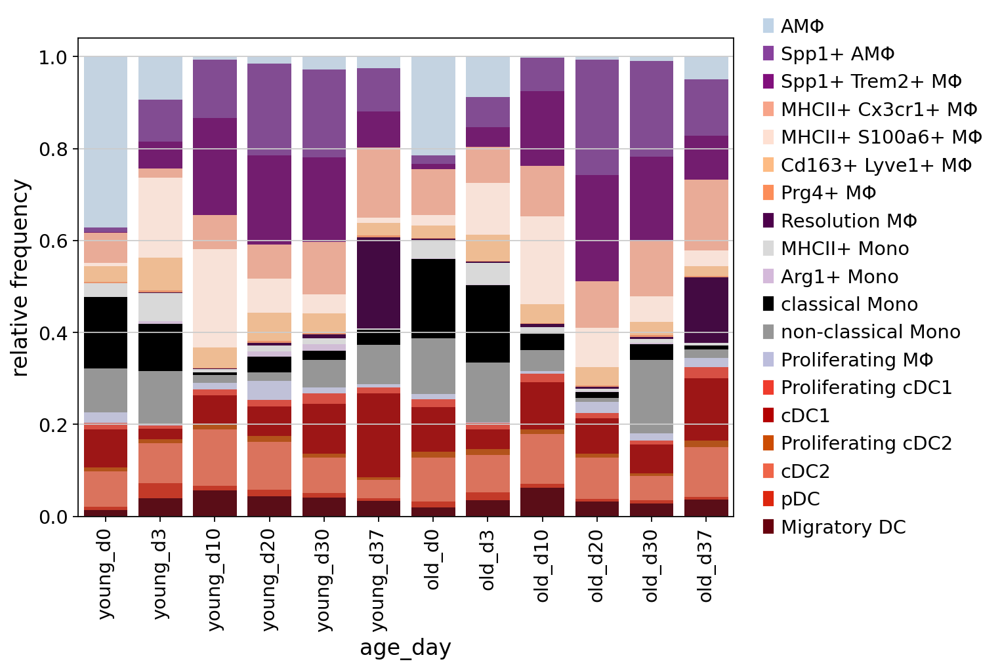

In [137]:
codes.plot_cluster_composition(relFreqs, xlabel = xlabel, figsize = (8, 6),
                               order=['young_d0','young_d3','young_d10', 'young_d20', 'young_d30', 'young_d37',
                                     'old_d0','old_d3','old_d10', 'old_d20', 'old_d30', 'old_d37'], cols=cols,
                               errbar = False, width = 0.8, 
                               save="/home/gotej/Projects/Aging_BleoModel/Paper_figures/figures/" + "_RelFreq_MNP_subset.pdf") 

In [138]:
xlabel = "day"                            ## in which column the time info is stored
order = MNP.obs[xlabel].cat.categories
print(order)
MNP.obs["days_numeric"] = [list(order).index(i) for i in MNP.obs[xlabel]]

Index(['d0', 'd3', 'd10', 'd20', 'd30', 'd37'], dtype='object')


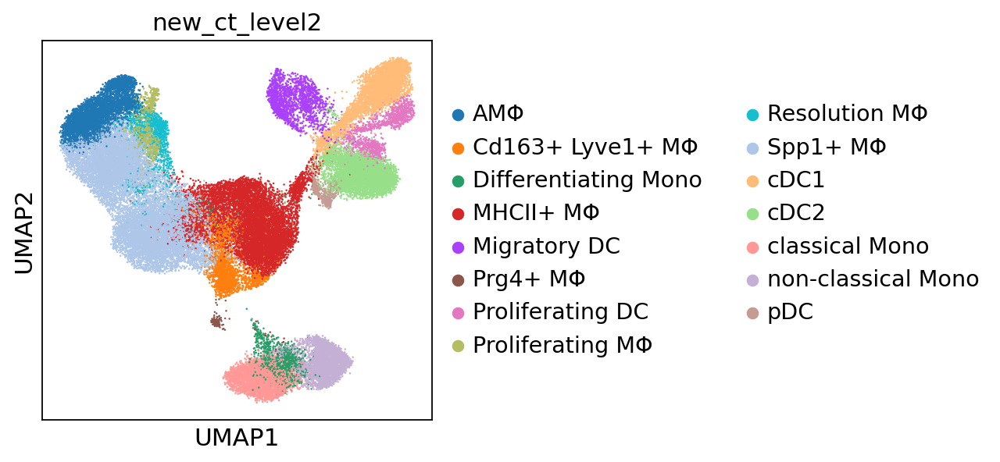

In [139]:
ct_map = { 

### MNP ###
    'AΜΦ' : 'AΜΦ',
    'Spp1+ AΜΦ' :'Spp1+ ΜΦ' ,
    'Spp1+ Trem2+ ΜΦ' : 'Spp1+ ΜΦ',
    'MHCII+ Cx3cr1+ ΜΦ' : 'MHCII+ ΜΦ',
    'MHCII+ S100a6+ ΜΦ' : 'MHCII+ ΜΦ',
    'Cd163+ Lyve1+ ΜΦ': 'Cd163+ Lyve1+ ΜΦ',
    'Prg4+ ΜΦ' : 'Prg4+ ΜΦ',
    'Resolution ΜΦ' : 'Resolution ΜΦ',
    'MHCII+ Mono' : 'Differentiating Mono',
    'Arg1+ Mono' : 'Differentiating Mono',
    'classical Mono': 'classical Mono',
    'non-classical Mono': 'non-classical Mono',
    'Proliferating ΜΦ': 'Proliferating ΜΦ',
    'Proliferating cDC1' : 'Proliferating DC',
    'cDC1': 'cDC1',
    'Proliferating cDC2': 'Proliferating DC',
    'cDC2': 'cDC2',
    'pDC' : 'pDC',
    'Migratory DC': 'Migratory DC',
    }

MNP.obs["new_ct_level2"] = [ct_map[ct] for ct in MNP.obs.cell_type]
sc.pl.umap(MNP, color = ["new_ct_level2"], size = 5)

In [140]:
## Relative Frequencies split by condition by specifying Parameter condition
xlabel = "day"
group_by = "new_ct_level2"
condition = "age"
cols = MNP.uns["%s_colors" %condition]
order = MNP.obs["day"].cat.categories 

relFreqs = codes.calc_relFreq(MNP, group_by = group_by, xlabel = xlabel, condition = "age")
relFreqs.head(4)

,AΜΦ,Cd163+ Lyve1+ ΜΦ,Differentiating Mono,MHCII+ ΜΦ,Migratory DC,Prg4+ ΜΦ,Proliferating DC,Proliferating ΜΦ,Resolution ΜΦ,Spp1+ ΜΦ,cDC1,cDC2,classical Mono,non-classical Mono,pDC,day,age
oBf-d10-M12,0.002235,0.051397,0.017877,0.271508,0.065922,0.002235,0.035754,0.004469,0.006704,0.213408,0.100559,0.094972,0.051397,0.075978,0.005587,d10,old
oBf-d21-M20,0.014914,0.043997,0.014169,0.185682,0.036540,0.002237,0.033557,0.051454,0.008949,0.404176,0.075317,0.104400,0.009694,0.006711,0.008203,d20,old
oBf-d3-M3,0.088083,0.051813,0.022453,0.257340,0.046632,0.003454,0.055268,0.000000,0.000000,0.172712,0.039724,0.100173,0.062176,0.081174,0.018998,d3,old
oBf-d42-M35,0.031674,0.022624,0.003017,0.245852,0.042232,0.000000,0.028658,0.016591,0.276018,0.107089,0.134238,0.066365,0.010558,0.012066,0.003017,d37,old


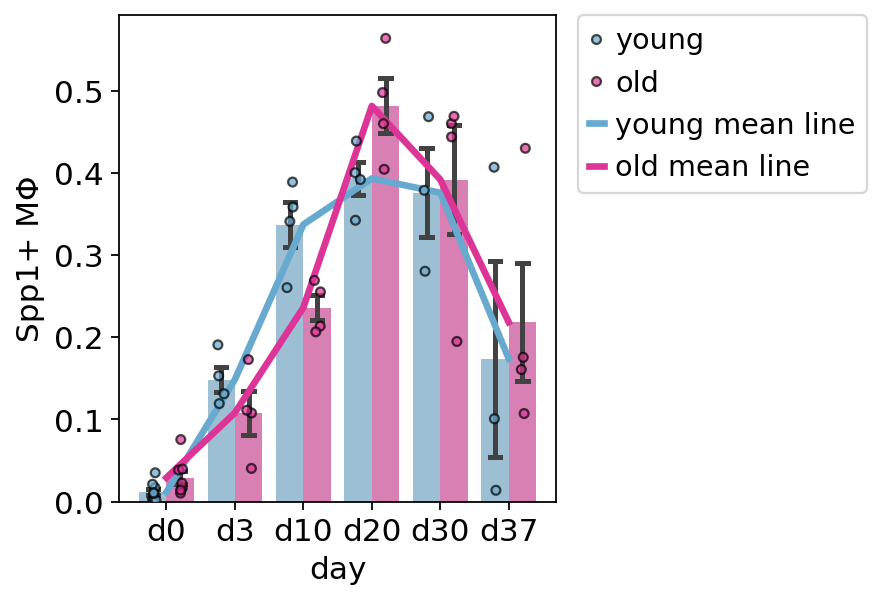

In [142]:
relFreqs = relFreqs.loc[relFreqs[xlabel].isin(order)]

fig, ax = plt.subplots()
fig.set_size_inches(3.5, 4)
ax.grid(visible=False)

sb.barplot(
    data=relFreqs,
    hue=condition,
    hue_order=['young', 'old'],
    x=xlabel,
    y="Spp1+ ΜΦ",
    order=order,
    palette=cols,
    errorbar="se",
    dodge=True,
    capsize=0.3,
    alpha=0.7,
    ax=ax
)

sb.stripplot(
    data=relFreqs,
    hue=condition,
    hue_order=['young', 'old'],
    x=xlabel,
    y="Spp1+ ΜΦ",
    order=order,
    palette=cols,
    dodge=True,
    edgecolor='black',
    linewidth=1.0,
    size=4,
    alpha=0.7,
    ax=ax
)

means = relFreqs.groupby([xlabel, condition])["Spp1+ ΜΦ"].mean().reset_index()
means[xlabel] = pd.Categorical(means[xlabel], categories=order, ordered=True)
means = means.sort_values([condition, xlabel])
xlabel_to_position = {label: i for i, label in enumerate(order)}

# Define manual line colors
line_colors = {
    'young': '#67a9cf',
    'old': '#dd3497'
}

# Plot for each condition
for cond in ['young', 'old']:
    subset = means[means[condition] == cond]
    x_positions = np.array([xlabel_to_position[val] for val in subset[xlabel]])
    ax.plot(
        x_positions,
        subset["Spp1+ ΜΦ"].values,
        linestyle='-',
        linewidth=3,
        color=line_colors[cond],   # <-- use manual color
        label=f"{cond} mean line"
    )

handles, labels = ax.get_legend_handles_labels()
unique = dict(zip(labels, handles))
ax.legend(unique.values(), unique.keys(), bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.savefig("/home/gotej/Projects/Aging_BleoModel/Paper_figures/figures/" + "_rel_freq_Spp1+Macs.pdf")

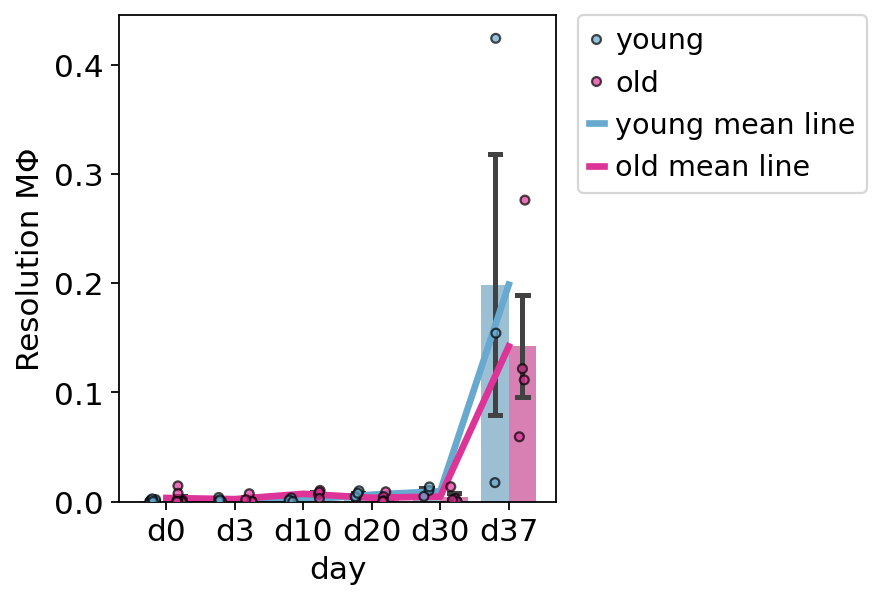

In [144]:
relFreqs = relFreqs.loc[relFreqs[xlabel].isin(order)]

fig, ax = plt.subplots()
fig.set_size_inches(3.5, 4)
ax.grid(visible=False)

sb.barplot(
    data=relFreqs,
    hue=condition,
    hue_order=['young', 'old'],
    x=xlabel,
    y="Resolution ΜΦ",
    order=order,
    palette=cols,
    errorbar="se",
    dodge=True,
    capsize=0.3,
    alpha=0.7,
    ax=ax
)

sb.stripplot(
    data=relFreqs,
    hue=condition,
    hue_order=['young', 'old'],
    x=xlabel,
    y="Resolution ΜΦ",
    order=order,
    palette=cols,
    dodge=True,
    edgecolor='black',
    linewidth=1.0,
    size=4,
    alpha=0.7,
    ax=ax
)

means = relFreqs.groupby([xlabel, condition])["Resolution ΜΦ"].mean().reset_index()
means[xlabel] = pd.Categorical(means[xlabel], categories=order, ordered=True)
means = means.sort_values([condition, xlabel])
xlabel_to_position = {label: i for i, label in enumerate(order)}

# Define manual line colors
line_colors = {
    'young': '#67a9cf',
    'old': '#dd3497'
}

# Plot for each condition
for cond in ['young', 'old']:
    subset = means[means[condition] == cond]
    x_positions = np.array([xlabel_to_position[val] for val in subset[xlabel]])
    ax.plot(
        x_positions,
        subset["Resolution ΜΦ"].values,
        linestyle='-',
        linewidth=3,
        color=line_colors[cond],   # <-- use manual color
        label=f"{cond} mean line"
    )

handles, labels = ax.get_legend_handles_labels()
unique = dict(zip(labels, handles))
ax.legend(unique.values(), unique.keys(), bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.savefig("/home/gotej/Projects/Aging_BleoModel/Paper_figures/figures/" + "_rel_freq_Resolutions_Macs.pdf")

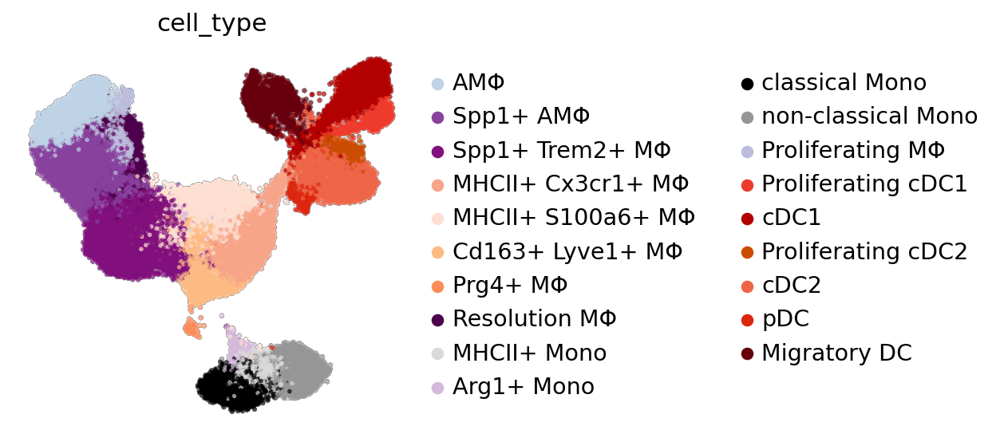

In [145]:
sc.pl.umap(MNP, color = ["cell_type"], frameon=False, add_outline=True, 
           outline_width=(0.05, 0.01), size=25, ncols=1, 
           legend_loc= "right margin", 
           save=("_MNP_ct_day_with_legend.pdf"))

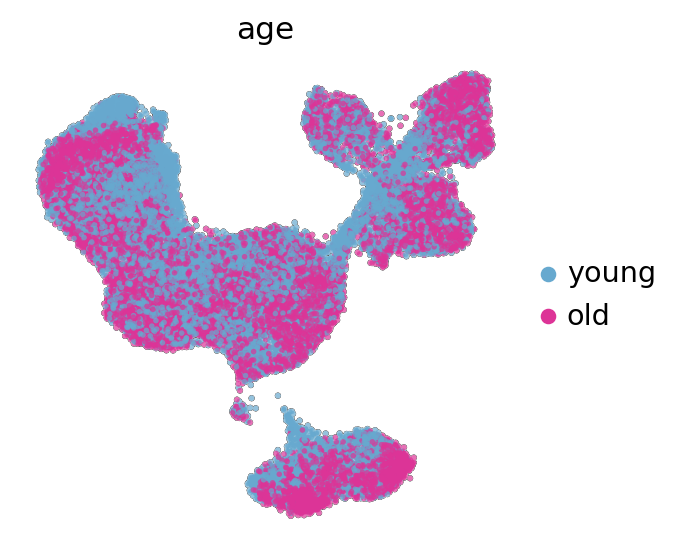

In [146]:
sc.pl.umap(MNP, color = ["age"], frameon=False, add_outline=True, 
           outline_width=(0.05, 0.01), size=25, ncols=1, 
           legend_loc= "right margin", 
           save=("_MNP_age_with_legend.pdf"))

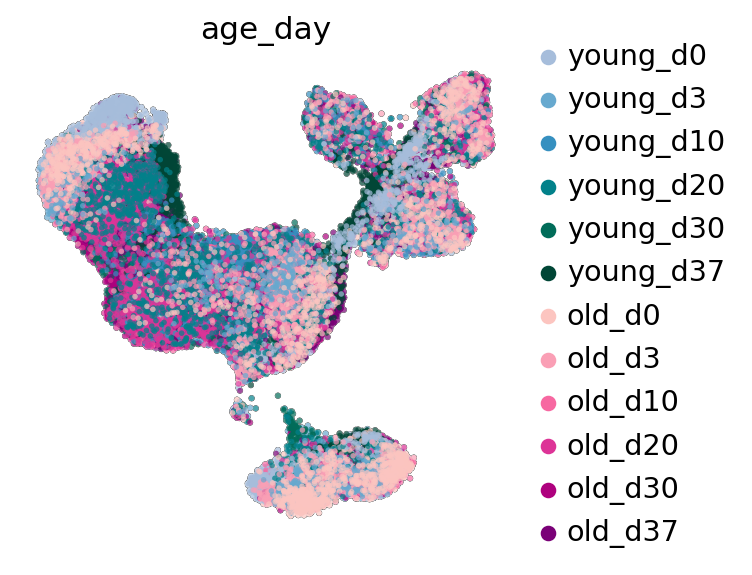

In [147]:
sc.pl.umap(MNP, color = ["age_day"], frameon=False, add_outline=True, 
           outline_width=(0.05, 0.01), size=25, ncols=1, 
           legend_loc= "right margin", 
           save=("_MNP_age_day_with_legend.pdf"))

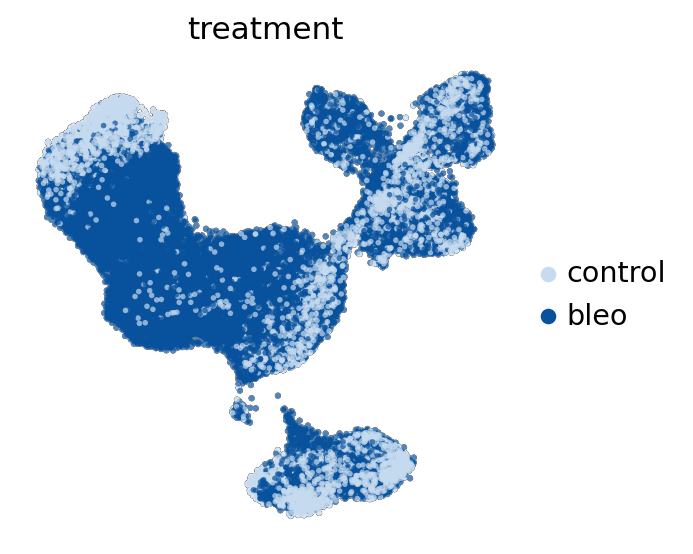

In [148]:
sc.pl.umap(MNP, color = ["treatment"], frameon=False, add_outline=True, 
           outline_width=(0.05, 0.01), size=25, ncols=1, 
           legend_loc= "right margin", 
           save=("_MNP_treatment_with_legend.pdf"))

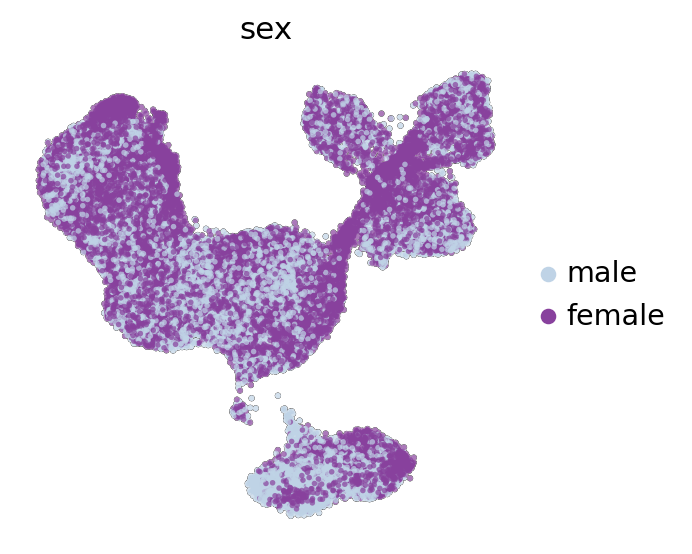

In [149]:
sc.pl.umap(MNP, color = ["sex"], frameon=False, add_outline=True, 
           outline_width=(0.05, 0.01), size=25, ncols=1, 
           legend_loc= "right margin", 
           save=("_MNP_sex_with_legend.pdf"))

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_cell_type']`
categories: AΜΦ, Spp1+ AΜΦ, Spp1+ Trem2+ ΜΦ, etc.
var_group_labels: Arg1+ Mono, non-classical Mono, MHCII+ Mono, etc.


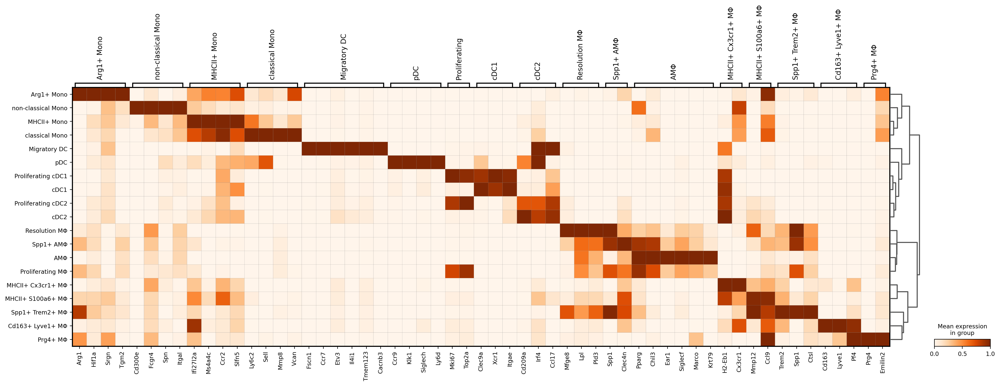

In [150]:
plt.rcdefaults()
plt.rcParams['pdf.fonttype'] = 42
## custom heatmap
celltype_markers={'Arg1+ Mono': ['Arg1', 'Hif1a', 'Srgn','Tgm2'],
                  'non-classical Mono': ['Cd300e', 'Fcgr4', 'Spn', 'Itgal'],
                  'MHCII+ Mono': ['Ifi27l2a', "Ms4a4c", "Ccr2", "Slfn5"],
                  'classical Mono': ['Ly6c2', "Sell", "Mmp8", "Vcan"],
                  'Migratory DC': ['Fscn1', 'Ccr7', 'Etv3', 'Il4i1', 'Tmem123', 'Cacnb3'],
                  'pDC': ['Ccr9', 'Klk1', 'Siglech', 'Ly6d'],
                  'Proliferating' : ['Mki67','Top2a'],
                  'cDC1': ['Clec9a', 'Xcr1', 'Itgae'],
                  'cDC2': ['Cd209a', 'Irf4', 'Ccl17'],
                  'Resolution ΜΦ': ['Mfge8', 'Lpl', 'Pld3'],
                  'Spp1+ AΜΦ' : ['Spp1', 'Clec4n'],
                  'AΜΦ' : ['Pparg', 'Chil3','Ear1','Siglecf','Marco', 'Krt79'],
                  'MHCII+ Cx3cr1+ ΜΦ' : ['H2-Eb1','Cx3cr1'],
                  'MHCII+ S100a6+ ΜΦ': ['Mmp12', 'Ccl9'],
                  'Spp1+ Trem2+ ΜΦ' : ['Trem2', 'Spp1', 'Ctsl'],
                  'Cd163+ Lyve1+ ΜΦ' : ['Cd163','Lyve1','Pf4'],
                  'Prg4+ ΜΦ' : ['Prg4', 'Emilin2'],            
                 
                 }
sc.tl.dendrogram(MNP, 'cell_type')
sc.pl.matrixplot(MNP, celltype_markers, groupby = 'cell_type', standard_scale='var', dendrogram=True, cmap="Oranges",
                save=("_markerplot_horizontal_dendogram_MNP.pdf")) 